<a href="https://colab.research.google.com/github/AliaaElshamekh/Identification-of-Art-Paintings-by-Machine-Learning/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
!pip install mglearn

     |████████████████████████████████| 542kB 8.7MB/s 
  Created wheel for mglearn: filename=mglearn-0.1.9-py2.py3-none-any.whl size=582638 sha256=4346bc7eb682c8d651a4dc0e81b89a800d89d1bdf290a0fbd22251af63c429c3
  Stored in directory: /root/.cache/pip/wheels/eb/a6/ea/a6a3716233fa62fc561259b5cb1e28f79e9ff3592c0adac5f0
Successfully built mglearn


In [ ]:
!pip install scikit-plot

In [ ]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler,MinMaxScaler,Normalizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import mglearn
from sklearn.metrics import confusion_matrix,f1_score
from time import time
from IPython.display import display
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, make_scorer,roc_curve,roc_auc_score
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import validation_curve
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score,classification_report, precision_score, recall_score
from sklearn.pipeline import FeatureUnion
from sklearn.feature_selection import mutual_info_classif,SelectFromModel,f_classif
import scikitplot as skplt
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
import pickle

**Project goal** \
 create a model that predicts the artist that painted the painting. \


| class      | Artist      |
| ----------- | ----------- |
| 0   | Pierre-Auguste_Renoir       |
| 1   | Raphael        |
| 2   | Leonardo_da_Vinci        |
| 3   | Sandro_Botticelli        |
| 4   | Francisco_Goya        |
| 5   | Vincent_van_Gogh        |
| 6   | Pablo_Picasso        |
| 7   | Albrecht_Durer        |
| 8   | Others        |


# Load data

In [ ]:
label = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/labels.csv', index_col=False, header=None)
features = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/extracted_features.csv', index_col=False, header=None)
images = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/raw_images.csv', index_col=False, header=None)

In [ ]:
classes = ['Pierre-Auguste_Renoir','Raphael', 'Leonardo_da_Vinci', 'Sandro_Botticelli', 'Francisco_Goya', 'Vincent_van_Gogh', 'Pablo_Picasso','Albrecht_Durer', 'Others']

In [ ]:
features.shape, label.shape#, images.shape

((2220, 64), (2220, 1))

In [ ]:
features.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
0,0.0,3.393926,0.0,0.0,0.0,0.000000,0.0,3.665976,0.0,0.000000,0.0,0.0,0.0,4.111579,0.0,1.189714,0.000000,0.0,0.0,0.000000,16.869919,32.927246,0.0,0.0,0.0,0.0,0.0,0.000000,7.720374,18.451365,0.000000,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,15.573765,0.0,0.0,0.000000,0.0,0.000000,13.202160,0.0,0.0,9.051663,10.212154,0.0,2.639315,0.0,0.0,1.325778,0.000000,0.0,0.345167
1,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,9.844789,0.0,0.000000,0.000000,0.0,0.0,0.000000,39.711704,15.642507,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,8.201958,5.128381,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,1.877754,0.0,0.000000,0.0,0.0,0.000000,0.0,8.520062,0.000000,0.0,0.0,12.000673,3.030629,0.0,0.000000,0.0,0.0,0.000000,4.611618,0.0,0.000000
2,0.0,9.544834,0.0,0.0,0.0,0.522025,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,85.605250,23.394674,0.0,0.0,0.0,0.0,0.0,7.937036,0.000000,4.976177,4.357213,0.000000,0.0,0.0,2.14931,0.0,0.0,0.0,0.000000,0.0,1.547831,2.165482,0.0,9.395863,0.0,0.000000,0.0,0.0,6.671557,0.0,4.867763,15.429013,0.0,0.0,35.066860,22.222430,0.0,9.505259,0.0,0.0,4.574607,0.000000,0.0,0.000000
3,0.0,3.069943,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,4.526962,0.0,0.0,0.0,2.628266,0.0,0.000000,0.000000,0.0,0.0,7.721177,38.967144,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,18.406149,0.820302,0.0,0.0,0.00000,0.0,0.0,0.0,17.030483,0.0,8.109619,3.742220,0.0,0.331216,0.0,1.892694,0.0,0.0,7.222126,0.0,0.000000,0.000000,0.0,0.0,3.505924,7.274180,0.0,0.000000,0.0,0.0,16.100977,8.347994,0.0,0.000000
4,0.0,0.440625,0.0,0.0,0.0,4.463159,0.0,2.447286,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,63.417835,0.0,0.0,0.000000,49.963837,36.088627,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,7.91485,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,4.182277,0.0,0.000000,0.000000,0.0,0.0,30.884500,2.322722,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000


In [ ]:
# some basic stats on the features
features.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
count,2220.0,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.0,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.00000,2220.000000,2220.0,2220.0,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.0,2220.000000,2220.000000,2220.000000,2220.0,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.000000,2220.00000,2220.000000,2220.0,2220.000000,2220.000000,2220.0,2220.000000
mean,0.0,6.601993,0.050044,3.540636,1.284573,0.953533,0.633569,3.391605,0.516075,1.359155,0.004051,0.011095,0.074333,1.931070,0.0,0.394837,5.201520,0.003775,0.178738,1.308776,20.224333,6.860730,1.815266,0.21264,0.087485,0.0,0.0,0.135966,2.812123,2.992736,7.577958,0.387651,0.624953,0.036102,4.134088,0.0,4.090263,0.784588,1.929567,0.0,5.178326,0.864181,0.003795,0.678392,0.975783,7.916996,1.959653,0.461044,13.758045,0.002852,4.909585,7.219026,0.034509,0.440540,7.756746,3.869980,4.652292,1.81051,1.404614,0.0,3.593796,3.926972,0.0,0.939838
std,0.0,11.125774,0.603434,8.767412,4.070607,3.159986,3.183287,6.537269,2.136873,3.916918,0.120421,0.299963,0.856635,5.080471,0.0,1.885094,9.388518,0.177852,1.521135,4.451996,20.134189,11.971627,5.361033,1.87358,0.861527,0.0,0.0,1.110338,7.963824,6.786574,12.275682,2.165550,3.064266,0.464718,7.191601,0.0,9.085179,3.429242,5.495805,0.0,9.093074,3.682555,0.178803,2.618688,3.845268,11.904567,5.237073,2.472864,18.227841,0.108772,8.426434,10.124949,0.571650,1.938919,10.130543,8.344778,9.792057,4.77292,3.673802,0.0,7.799738,7.307944,0.0,3.490395
min,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
25%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
50%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,16.082237,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.683213,0.000000,0.000000,4.593300,0.000000,0.000000,2.446785,0.000000,0.000000,3.483127,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
75%,0.0,9.344433,0.000000,0.000000,0.000000,0.000000,0.000000,4.161618,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,6.838275,0.000000,0.000000,0.000000,33.623835,9.582797,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.386078,2.358174,11.655713,0.000000,0.000000,0.000000,5.965963,0.0,1.983014,0.000000,0.000000,0.0,7.514516,0.000000,0.000000,0.000000,0.000000,11.

Text(0.5, 1.0, 'class distribution')

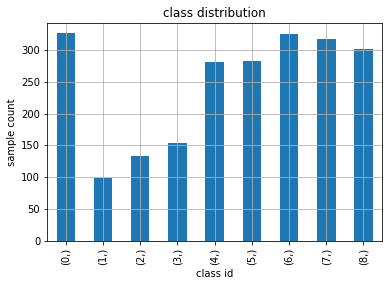

In [ ]:
# check the classes distribution
label.value_counts(sort=False).plot(kind='bar')
plt.grid()
plt.xlabel('class id')
plt.ylabel('sample count')
plt.title('class distribution')

In [ ]:
def f_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names)))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.show()

# Data Preprocessing

In [ ]:
indices = np.arange(len(features))

X_train, X_test, y_train, y_test, idx1, idx2 = train_test_split(features.values, label.values, indices, random_state=42, test_size=0.2,stratify=label.values)

img_train = images.values[idx1,:] # training images
img_test = images.values[idx2,:] # testing images

y_train = y_train.ravel()
y_test = y_test.ravel()

In [ ]:
X_train.shape, y_train.shape, img_train.shape

((1776, 64), (1776,), (1776, 67500))

Text(0.5, 1.0, 'Others')

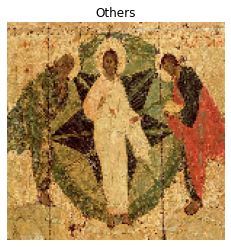

In [ ]:
plt.axis("off")
labels_arr = label.values
plt.imshow(img_train[1].reshape(150,150,3))
plt.title(classes[y_train[1]])

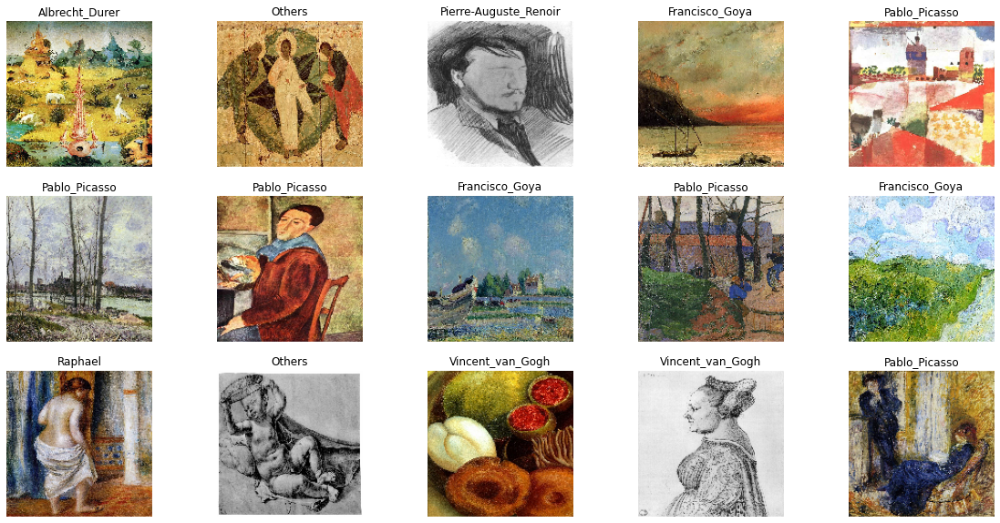

In [ ]:
# plot a sample from each class
plt.figure(figsize=(20,10))
for i in range(0,15) :
    plt.subplot(3,5,i+1)
    plt.axis('off')
    plt.imshow(img_train[i].reshape(150,150,3))
    #showImage(X_train[i])
    plt.title(classes[y_train[i]])
    


# KNN Classifier

## Without PCA or Feature Selection

In [ ]:
scalers_to_test = [StandardScaler(), Normalizer(), MinMaxScaler()]

knn_pipe = Pipeline([
        ('scaler', 'passthrough'),
        ('classifier',KNeighborsClassifier())])

params = {'scaler': scalers_to_test,
        'classifier__n_neighbors': [5,10,20,30,50],}

In [ ]:
# Find best parameters using grid search
knn_gs = GridSearchCV(knn_pipe, params, cv=4,verbose=1)
#Fit model
knn_gs.fit(X_train,y_train)
scores = cross_val_score(knn_gs, X_train, y_train, scoring='accuracy', cv=4)



Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.0s finished


In [ ]:
print("KNN best parameters :",knn_gs.best_params_)
print("KNN model based on all features")
print("Training accuracy score = ", knn_gs.score(X_train, y_train))
print('CV mean accuracy: %.3f +/-%.3f' % (np.mean(scores),np.std(scores)))

print("Testing accuracy score = ", knn_gs.score(X_test, y_test))

KNN best parameters : {'classifier__n_neighbors': 5, 'scaler': Normalizer(copy=True, norm='l2')}
KNN model based on all features
Training accuracy score =  0.9183558558558559
CV mean accuracy: 0.878 +/-0.017
Testing accuracy score =  0.8716216216216216


In [ ]:
print("Testing accuracy score = ", knn_gs.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,knn_gs.best_estimator_.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,knn_gs.best_estimator_.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,knn_gs.best_estimator_.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,knn_gs.best_estimator_.predict_proba(X_test), multi_class='ovr'))

Testing accuracy score =  0.8716216216216216
Best estimator training f1 score 0.9153577315644726
Best estimator testing f1 score 0.8668471957958542
Best estimator train roc-auc score 0.9973517225098273
Best estimator testing roc-auc score 0.9807386431743598


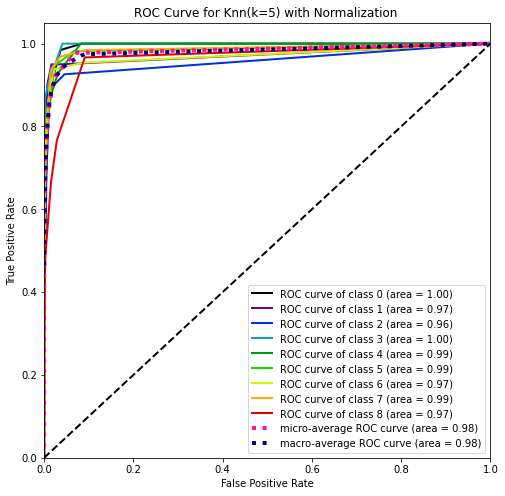

In [ ]:
predict_knn_gs1 = knn_gs.best_estimator_.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, predict_knn_gs1,figsize=(8,8),title="ROC Curve for Knn(k=5) with Normalization ")
plt.show()

In [ ]:
results_df = pd.DataFrame(knn_gs.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
"5_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 5, 'scaler': Norma...",1,0.878378,0.016627
"10_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 10, 'scaler': Norm...",2,0.862050,0.007863
"20_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 20, 'scaler': Norm...",3,0.831081,0.011148
"5_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 5, 'scaler': MinMa...",4,0.814189,0.019795
"10_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 10, 'scaler': MinM...",5,0.811374,0.008777
"30_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 30, 'scaler': Norm...",6,0.805743,0.008179
"20_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 20, 'scaler': MinM...",7,0.780968,0.009993
"50_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 50, 'scaler': Norm...",8,0.768018,0.005517
"30_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 30, 'scaler': MinM...",9,0.765766,0.006757


### Save the model

In [ ]:
import pickle
pkl_filename = "knn_all.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(knn_gs, file)

## Miclassification

In [ ]:
knn_pred=knn_gs.predict(X_test)
index = 0
misclassifiedIndexes_knn = []
for label, predict in zip(knn_pred, y_test):
    if label != predict: 
        misclassifiedIndexes_knn.append(index)
    index +=1

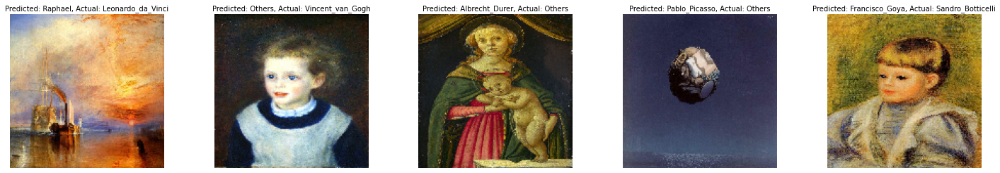

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_knn[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(knn_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

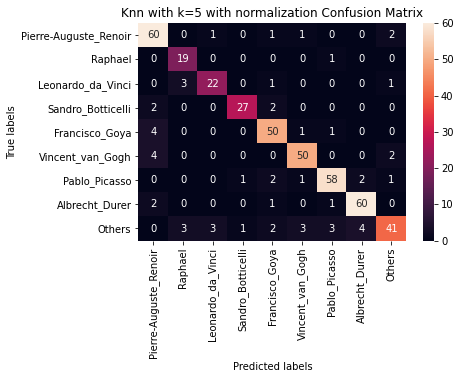

In [ ]:
cnf_matrix_knn = confusion_matrix(y_test,knn_gs.best_estimator_.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_knn, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Knn with k=5 with normalization Confusion Matrix' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

## With Feature Selection

In [ ]:
knn_pipe_Best_Feat = Pipeline([
  ('feature_selection', SelectKBest(f_classif, k=40)),
  ('scaler', 'passthrough'),
  ('classifier',KNeighborsClassifier())
])

# Find best parameters using grid search
knn_gs = GridSearchCV(knn_pipe_Best_Feat, params, cv=4,verbose=1)
#Fit model
knn_gs.fit(X_train,y_train)
print(knn_gs.best_params_)
scores = cross_val_score(knn_gs, X_train, y_train, scoring='accuracy', cv=4)

Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'classifier__n_neighbors': 5, 'scaler': Normalizer(copy=True, norm='l2')}
Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.1s finished


In [ ]:
print(knn_gs.best_params_)
print("KNN model based on KBest 40 features")
print("Training accuracy score = ", knn_gs.score(X_train, y_train))
print('CV mean accuracy: %.3f +/-%.3f' % (np.mean(scores),np.std(scores)))


{'classifier__n_neighbors': 5, 'scaler': Normalizer(copy=True, norm='l2')}
KNN model based on KBest 40 features
Training accuracy score =  0.9194819819819819
CV mean accuracy: 0.872 +/-0.013


In [ ]:
print("Testing accuracy score = ", knn_gs.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,knn_gs.best_estimator_.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,knn_gs.best_estimator_.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,knn_gs.best_estimator_.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,knn_gs.best_estimator_.predict_proba(X_test), multi_class='ovr'))

Testing accuracy score =  0.8693693693693694
Best estimator training f1 score 0.9169620175007096
Best estimator testing f1 score 0.8658703167158326
Best estimator train roc-auc score 0.997245018577626
Best estimator testing roc-auc score 0.9802778324487458


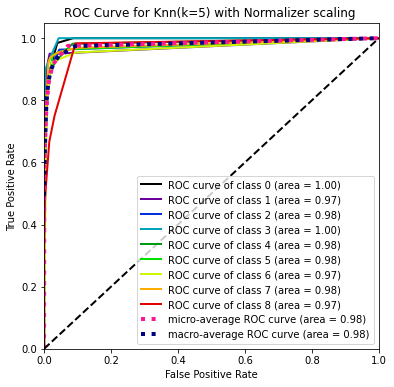

In [ ]:
predict_knn_gs2 = knn_gs.best_estimator_.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, predict_knn_gs2,figsize=(6,6),title="ROC Curve for Knn(k=5) with Normalizer scaling ")
plt.show()

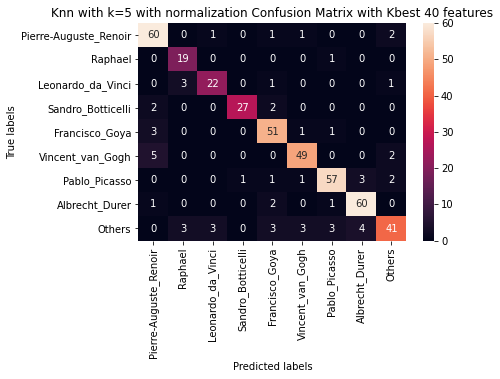

In [ ]:
cnf_matrix_knn = confusion_matrix(y_test,knn_gs.best_estimator_.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_knn, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Knn with k=5 with normalization Confusion Matrix with Kbest 40 features' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

In [ ]:
results_df = pd.DataFrame(knn_gs.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
"5_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 5, 'scaler': Norma...",1,0.867117,0.006942
"10_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 10, 'scaler': Norm...",2,0.858108,0.018776
"20_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 20, 'scaler': Norm...",3,0.835023,0.009993
"30_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 30, 'scaler': Norm...",4,0.814189,0.021865
"5_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 5, 'scaler': MinMa...",5,0.804617,0.020294
"10_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 10, 'scaler': MinM...",6,0.800676,0.024179
"50_Normalizer(copy=True, norm='l2')","{'classifier__n_neighbors': 50, 'scaler': Norm...",7,0.782095,0.014972
"20_MinMaxScaler(copy=True, feature_range=(0, 1))","{'classifier__n_neighbors': 20, 'scaler': MinM...",8,0.782095,0.019069
"5_StandardScaler(copy=True, with_mean=True, with_std=True)","{'classifier__n_neighbors': 5, 'scaler': Stand...",9,0.777027,0.013975


## Validation Curves for KNN without Feature Selection

In [ ]:
k_neigh =[5,8,10,15,20,30,50]
knn_pipe_s = Pipbeline([
        ('scaler', MinMaxScaler()),
        ('classifier',KNeighborsClassifier())])
train_scores, test_scores = validation_curve(knn_pipe_s, X_train, y_train, param_name="classifier__n_neighbors", param_range=k_neigh,
    scoring="accuracy", n_jobs=1,cv = 4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

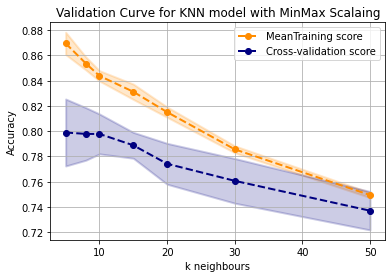

In [ ]:
plt.title("Validation Curve for KNN model with MinMax Scalaing")
plt.xlabel("k neighbours")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(k_neigh, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.plot(k_neigh, train_scores_mean, label="MeanTraining score",
             color="darkorange", lw=lw ,ls='--',marker ='o')

plt.plot(k_neigh, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## F-score

In [ ]:
f1 = make_scorer(f1_score , average='macro')
knn_gs = GridSearchCV(knn_pipe,
                      params,
                      cv=4,
                      verbose=1,
                      scoring=f1)
#Fit model
knn_gs.fit(X_train,y_train)
print(knn_gs.best_params_)
print("Training f1 score = ", knn_gs.score(X_train, y_train))
print("Testing f1 score = ", knn_gs.score(X_test, y_test))

Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    5.9s finished


{'classifier__n_neighbors': 5, 'scaler': Normalizer(copy=True, norm='l2')}
Training f1 score =  0.9127531013075332
Testing f1 score =  0.8835231391010372


In [ ]:
print("Best estimatore f1 score",f1_score(y_train,knn_gs.best_estimator_.predict(X_train),average="macro"))

Best estimatore f1 score 0.9127531013075332


In [ ]:
f1_score(y_train,knn_gs.best_estimator_.predict(X_train),average="macro")

0.9127531013075332

In [ ]:
knn_f1_scores = cross_val_score(knn_gs, X_train, y_train, scoring=f1, cv=4)

Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.2s finished


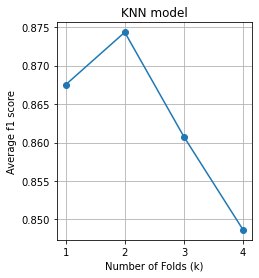

In [ ]:
# plot the change in the average accuracy according to k 
plt.figure(figsize=(3.5,4))
plt.title("KNN model")
plt.xlabel("Number of Folds (k)")
plt.ylabel("Average f1 score")
plt.xticks =np.arange(1, 5, 1)
plt.grid()
plt.plot(np.arange(1, 5, 1),knn_f1_scores,'o-');

##ROC-Score

In [ ]:
# Find best parameters using grid search with ROC
knn_gs_roc = GridSearchCV(knn_pipe,
                      params,
                      cv=4,
                      verbose=1,
                      scoring='roc_auc_ovr')
#Fit model
knn_gs_roc.fit(X_train,y_train)
print(knn_gs_roc.best_params_)
print("Training roc score = ", knn_gs_roc.score(X_train, y_train))
print("Testing roc score = ", knn_gs_roc.score(X_test, y_test))
knn_roc_scores = cross_val_score(knn_gs_roc, X_train, y_train, scoring='roc_auc_ovr', cv=4)

Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    5.8s finished


{'classifier__n_neighbors': 10, 'scaler': Normalizer(copy=True, norm='l2')}
Training roc score =  0.9957595417877442
Testing roc score =  0.9847563435275011
Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 4 folds for each of 15 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    3.9s finished


In [ ]:
print(knn_gs_roc.best_params_)
print("KNN model based on all features")
print("Training roc score = ", knn_gs_roc.score(X_train, y_train))
print('CV mean roc: %.3f +/-%.3f' % (np.mean(knn_roc_scores),np.std(knn_roc_scores)))

{'classifier__n_neighbors': 10, 'scaler': Normalizer(copy=True, norm='l2')}
KNN model based on all features
Training roc score =  0.9957595417877442
CV mean roc: 0.983 +/-0.003


In [ ]:
roc_auc_score(y_train, knn_gs_roc.best_estimator_.predict_proba(X_train), multi_class='ovr')

0.9957595417877442

# Random Forest


## Without PCA

In Random forest experiment , I am gonna try apply PCA with 2 different components , and plot heat map with various parameter tuning and get the feature importance (pipeline with PCA, Scaling and RF) 


In [ ]:
pipe_rf = Pipeline([('scl', Normalizer()),
			('clf', RandomForestClassifier(random_state=42))])

grid_params_rf = [{'clf__criterion': ['gini', 'entropy'],
		'clf__n_estimators': [10, 50, 100, 200],
    'clf__min_samples_leaf': [2,5,10,15,100],
    'clf__max_depth': [5,8,15,25,30]}]

gs_rf = GridSearchCV(estimator=pipe_rf,
			param_grid=grid_params_rf,
			scoring='accuracy',
			cv=4, 
			n_jobs=-1)

gs_rf.fit(X_train, y_train)


GridSearchCV(cv=4, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scl',
                                        Normalizer(copy=True, norm='l2')),
                                       ('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_weight=None,
                                                               criterion='gini',
                                                               max_depth=None,
                                                               max_features='auto',
                                                               max_leaf_nodes=None,
                                                               max_samples=None,
                                                               min_impurity_decrease=0.0,
            

In [ ]:
results_df = pd.DataFrame(gs_rf.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]


,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
gini_15_2_200,"{'clf__criterion': 'gini', 'clf__max_depth': 1...",1,0.884572,0.008333
gini_25_2_200,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",2,0.884009,0.015725
gini_30_2_200,"{'clf__criterion': 'gini', 'clf__max_depth': 3...",3,0.883446,0.016114
gini_25_2_100,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",4,0.877815,0.015956
gini_30_2_100,"{'clf__criterion': 'gini', 'clf__max_depth': 3...",5,0.876689,0.016579
...,...,...,...,...
gini_30_100_10,"{'clf__criterion': 'gini', 'clf__max_depth': 3...",193,0.546734,0.012877
entropy_8_100_10,"{'clf__criterion': 'entropy', 'clf__max_depth'...",197,0.545608,0.021625
entropy_15_100_10,"{'clf__criterion': 'entropy', 'clf__max_depth'...",197,0.545608,0.021625


In [ ]:
print("RF model based on all features")
# Best params
print('Best params: %s' % gs_rf.best_params_)
	# Best training data accuracy
print('Best training accuracy: %.3f' % gs_rf.best_score_)
print("Training accuracy score = ", gs_rf.score(X_train, y_train))
print("Testing accuracy score = ", gs_rf.score(X_test, y_test))

RF model based on all features
Best params: {'clf__criterion': 'gini', 'clf__max_depth': 15, 'clf__min_samples_leaf': 2, 'clf__n_estimators': 200}
Best training accuracy: 0.885
Training accuracy score =  0.9836711711711712
Testing accuracy score =  0.8851351351351351


In [ ]:
pipe_rf_s = Pipeline([('clf', RandomForestClassifier(random_state=42))])

grid_params_rf_s = [{'clf__criterion': ['gini', 'entropy'],
		'clf__n_estimators': [10, 50, 100, 200],
    'clf__min_samples_leaf': [2,5,10,15,100],
    'clf__max_depth': [None,8,15,25,30]}]

gs_rf_s = GridSearchCV(estimator=pipe_rf_s,
			param_grid=grid_params_rf_s,
			scoring='accuracy',
			cv=4, 
			n_jobs=-1)

gs_rf_s.fit(X_train, y_train)


GridSearchCV(cv=4, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_weight=None,
                                                               criterion='gini',
                                                               max_depth=None,
                                                               max_features='auto',
                                                               max_leaf_nodes=None,
                                                               max_samples=None,
                                                               min_impurity_decrease=0.0,
                                                               min_impurity_split=None,
                                              

In [ ]:
print("RF model based on all features no scaling")
# Best params
print('Best params: %s' % gs_rf_s.best_params_)
	# Best training data accuracy
print('Best training accuracy: %.3f' % gs_rf_s.best_score_)
print("Training accuracy score = ", gs_rf_s.score(X_train, y_train))
print("Testing accuracy score = ", gs_rf_s.score(X_test, y_test))

RF model based on all features no scaling
Best params: {'clf__criterion': 'gini', 'clf__max_depth': 25, 'clf__min_samples_leaf': 2, 'clf__n_estimators': 200}
Best training accuracy: 0.869
Training accuracy score =  0.9876126126126126
Testing accuracy score =  0.8671171171171171


### Save the model

In [ ]:
import pickle
pkl_filename = "gs_RF.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(gs_rf, file)

### Misclassification

In [ ]:
RF1_pred=gs_rf.predict(X_test)
index = 0
misclassifiedIndexes_RF1 = []
for label, predict in zip(RF1_pred, y_test):
    if label != predict: 
        misclassifiedIndexes_RF1.append(index)
    index +=1

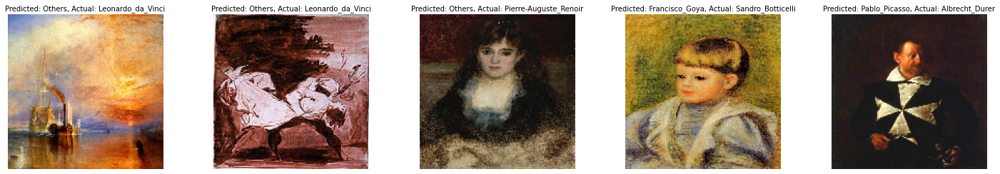

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_RF1[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(RF1_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

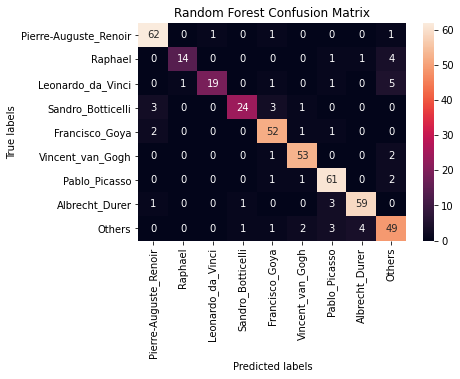

In [ ]:
cnf_matrixgs_rf = confusion_matrix(y_test,gs_rf.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrixgs_rf, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Random Forest Confusion Matrix' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

### Validation Curves

In [ ]:
param_range = np.arange(1, 50, 5)
pipe_rf = Pipeline([('scl', Normalizer()),
			('clf', RandomForestClassifier(random_state=42))])
train_scores, test_scores = validation_curve(pipe_rf, X_train, y_train, param_name="clf__max_depth", param_range=param_range,
    scoring="accuracy", n_jobs=1,cv = 4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

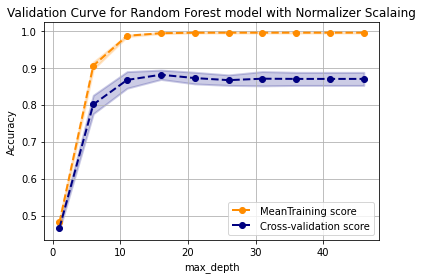

In [ ]:
plt.title("Validation Curve for Random Forest model with Normalizer Scalaing")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
#plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.plot(param_range, train_scores_mean, label="MeanTraining score",
             color="darkorange", lw=lw ,ls='--',marker ='o')

plt.plot(param_range, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

In [ ]:
nest=[20,30,40,60,100,150,200,250,500]
train_scores, test_scores = validation_curve( RandomForestClassifier(random_state=42), X_train, y_train, param_name="n_estimators", param_range=nest,
    scoring="accuracy", n_jobs=1,cv = 4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

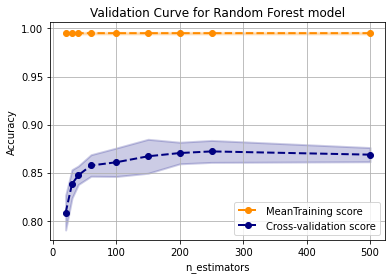

In [ ]:
plt.title("Validation Curve for Random Forest model")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
#plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(nest, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
plt.fill_between(nest, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.plot(nest, train_scores_mean, label="MeanTraining score",
             color="darkorange", lw=lw ,ls='--',marker ='o')

plt.plot(nest, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## With PCA

### Accuracy

In [ ]:
pca = PCA()
pipe_rf_pca = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('clf', RandomForestClassifier(random_state=42))])

params_rf_pca = [{'pca__n_components': [15, 30, 45],
                 'clf__criterion': ['gini', 'entropy'],
        	       'clf__n_estimators': [50, 100, 200],
                  #'clf__min_samples_leaf': [2,5,10,15,100],
                  'clf__max_depth': [5,15,25]}]

gs_rf_pca = GridSearchCV(estimator=pipe_rf_pca,
			param_grid=params_rf_pca,
			scoring='accuracy',
			cv=4, 
			n_jobs=-1)

gs_rf_pca.fit(X_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaling',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_wei

In [ ]:
print("RF model with PCA")
# Best params
print('Best params: %s' % gs_rf_pca.best_params_)
	# Best training data accuracy
print('Best training accuracy: %.3f' % gs_rf_pca.best_score_)
print("Training accuracy score = ", gs_rf_pca.score(X_train, y_train))
print("Testing accuracy score = ", gs_rf_pca.score(X_test, y_test))


RF model with PCA
Best params: {'clf__criterion': 'entropy', 'clf__max_depth': 15, 'clf__n_estimators': 200, 'pca__n_components': 45}
Best training accuracy: 0.809
Training accuracy score =  0.9932432432432432
Testing accuracy score =  0.8378378378378378


In [ ]:
results_df = pd.DataFrame(gs_rf_pca.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
].head()


,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
entropy_15_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",1,0.808559,0.009555
entropy_25_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",2,0.806869,0.012063
gini_15_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 1...",3,0.805743,0.024794
gini_25_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",4,0.805180,0.024800
gini_25_100_45,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",5,0.801802,0.020270
gini_15_100_45,"{'clf__criterion': 'gini', 'clf__max_depth': 1...",6,0.798423,0.016124
entropy_25_100_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",7,0.795045,0.008576
entropy_15_100_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",8,0.794482,0.003331
entropy_15_100_30,"{'clf__criterion': 'entropy', 'clf__max_depth'...",9,0.793919,0.009354


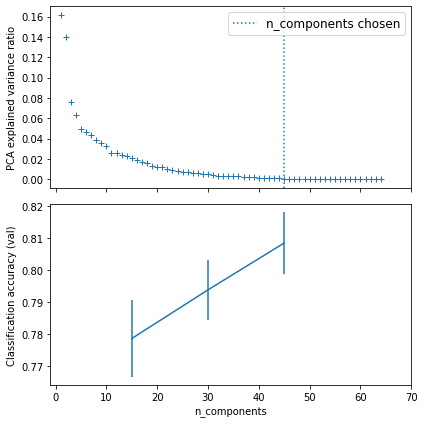

In [ ]:

# Plot the PCA spectrum
pca.fit(X_train)

fig, (ax0, ax1) = plt.subplots(nrows=2, sharex=True, figsize=(6, 6))
ax0.plot(np.arange(1, pca.n_components_ + 1),
         pca.explained_variance_ratio_, '+', linewidth=2)
ax0.set_ylabel('PCA explained variance ratio')

ax0.axvline(gs_rf_pca.best_estimator_.named_steps['pca'].n_components,
            linestyle=':', label='n_components chosen')
ax0.legend(prop=dict(size=12))

# For each number of components, find the best classifier results
results = pd.DataFrame(gs_rf_pca.cv_results_)
components_col = 'param_pca__n_components'
best_clfs = results.groupby(components_col).apply(
    lambda g: g.nlargest(1, 'mean_test_score'))

best_clfs.plot(x=components_col, y='mean_test_score', yerr='std_test_score',
               legend=False, ax=ax1)
ax1.set_ylabel('Classification accuracy (val)')
ax1.set_xlabel('n_components')

plt.xlim(-1, 70)

plt.tight_layout()
plt.show()

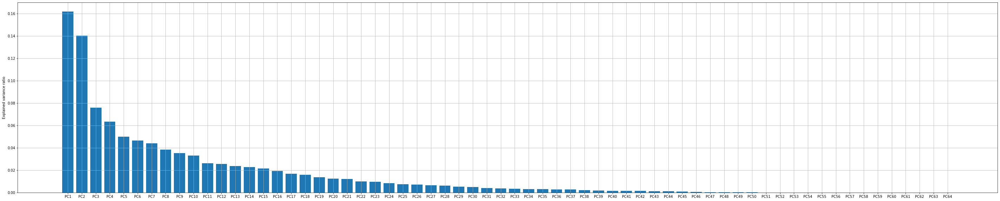

In [ ]:
explained_var = pca.explained_variance_ratio_

#plot explained variance
plt.figure(figsize=(50,10))
plt.bar(["PC{}".format(i) for i in range(1,len(explained_var)+1)], pca.explained_variance_ratio_)
plt.ylabel("Explained variance ratio")
plt.grid()

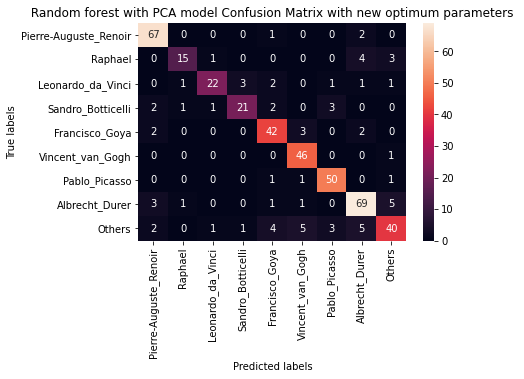

In [ ]:
cnf_matrix_rf_pca = confusion_matrix(y_test,gs_rf_pca.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_rf_pca, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' Random forest with PCA model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

### F1 score

In [ ]:
pca = PCA()
pipe_rf_pca = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('clf', RandomForestClassifier(random_state=42))])

params_rf_pca = [{'pca__n_components': [15, 30, 45],
                 'clf__criterion': ['gini', 'entropy'],
        	       'clf__n_estimators': [50, 100, 200],
                  #'clf__min_samples_leaf': [2,5,10,15,100],
                  'clf__max_depth': [5,15,25]}]

gs_rf_pca_f = GridSearchCV(estimator=pipe_rf_pca,
			param_grid=params_rf_pca,
			scoring=f1,
			cv=4, 
			n_jobs=-1)

gs_rf_pca_f.fit(X_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaling',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_wei

In [ ]:
print("RF model with PCA ")
# Best params
print('Best params: %s' % gs_rf_pca_f.best_params_)
	# Best training data accuracy
print('Best training f1 score: %.3f' % gs_rf_pca_f.best_score_)
print("Training f1 score = ", gs_rf_pca_f.score(X_train, y_train))
print("Testing f1 score = ", gs_rf_pca_f.score(X_test, y_test))


RF model with PCA 
Best params: {'clf__criterion': 'entropy', 'clf__max_depth': 15, 'clf__n_estimators': 200, 'pca__n_components': 45}
Best training f1 score: 0.786
Training f1 score =  0.9922817541853338
Testing f1 score =  0.8206224301232825


In [ ]:
results_df = pd.DataFrame(gs_rf_pca_f.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
].head()


,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
entropy_15_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",1,0.786278,0.011181
entropy_25_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",2,0.784634,0.011290
gini_25_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",3,0.781116,0.028928
gini_15_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 1...",4,0.779387,0.026636
gini_25_100_45,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",5,0.776757,0.022066


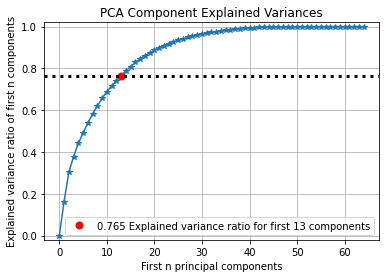

In [ ]:
pca.fit(X_train)
skplt.decomposition.plot_pca_component_variance(pca)

In [ ]:
probas_RF_pca_f = gs_rf_pca_f.predict_proba(X_test)

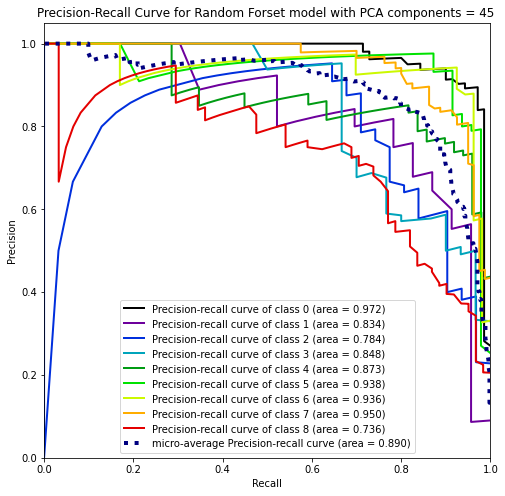

In [ ]:
skplt.metrics.plot_precision_recall_curve(y_test, probas_RF_pca_f,figsize=(8,8),title="Precision-Recall Curve for Random Forset model with PCA components = 45 ")
plt.show()

In [ ]:
y_pred = gs_rf_pca_f.predict(X_test)
report_RF_pca45 = classification_report(y_test,y_pred, output_dict=True)
df_rep_RF_pca45 = pd.DataFrame(report_RF_pca45).transpose()

In [ ]:
df_rep_RF_pca45

,precision,recall,f1-score,support
0,0.881579,0.957143,0.917808,70.000000
1,0.833333,0.652174,0.731707,23.000000
2,0.880000,0.709677,0.785714,31.000000
3,0.840000,0.700000,0.763636,30.000000
4,0.792453,0.857143,0.823529,49.000000
5,0.821429,0.978723,0.893204,47.000000
6,0.877193,0.943396,0.909091,53.000000
7,0.831325,0.862500,0.846626,80.000000
8,0.784314,0.655738,0.714286,61.000000
accuracy,0.837838,0.837838,0.837838,0.837838


### ROC

In [ ]:
pca = PCA()
pipe_rf_pca = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('clf', RandomForestClassifier(random_state=42))])

params_rf_pca = [{'pca__n_components': [15, 30, 45],
                 'clf__criterion': ['gini', 'entropy'],
        	       'clf__n_estimators': [50, 100, 200],
                  #'clf__min_samples_leaf': [2,5,10,15,100],
                  'clf__max_depth': [5,15,25]}]

gs_rf_pca_roc = GridSearchCV(estimator=pipe_rf_pca,
			param_grid=params_rf_pca,
			scoring="roc_auc_ovr",
			cv=4, 
			n_jobs=-1)

gs_rf_pca_roc.fit(X_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaling',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               ccp_alpha=0.0,
                                                               class_wei

In [ ]:
print("RF model with PCA ")
# Best params
print('Best params: %s' % gs_rf_pca_roc.best_params_)
	# Best training data accuracy
print('Best training roc score: %.3f' % gs_rf_pca_roc.best_score_)
print("Training roc score = ", gs_rf_pca_roc.score(X_train, y_train))
print("Testing roc score = ", gs_rf_pca_roc.score(X_test, y_test))


RF model with PCA 
Best params: {'clf__criterion': 'entropy', 'clf__max_depth': 25, 'clf__n_estimators': 200, 'pca__n_components': 45}
Best training roc score: 0.971
Training roc score =  0.9999831914784567
Testing roc score =  0.9761131105227618


In [ ]:
results_df = pd.DataFrame(gs_rf_pca_roc.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
].head()


,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
entropy_25_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",1,0.971078,0.001217
entropy_15_200_45,"{'clf__criterion': 'entropy', 'clf__max_depth'...",2,0.971030,0.001646
gini_15_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 1...",3,0.970783,0.002492
gini_25_200_45,"{'clf__criterion': 'gini', 'clf__max_depth': 2...",4,0.970194,0.003837
entropy_25_200_30,"{'clf__criterion': 'entropy', 'clf__max_depth'...",5,0.970051,0.002556


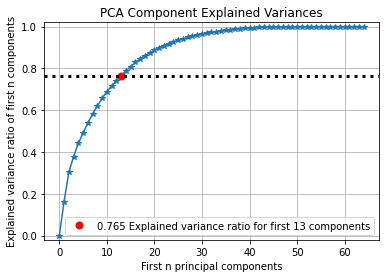

In [ ]:
pca.fit(X_train)
skplt.decomposition.plot_pca_component_variance(pca)

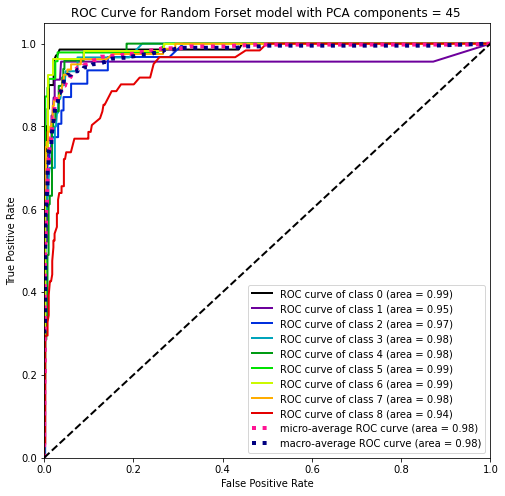

In [ ]:
probas_RF_pca_roc = gs_rf_pca_roc.predict_proba(X_test)
skplt.metrics.plot_roc(y_test, probas_RF_pca_roc,figsize=(8,8),title="ROC Curve for Random Forset model with PCA components = 45 ")
plt.show()

# Logestic Regression 

## Without PCA

In [ ]:
# Define a pipeline to search for the best combination of PCA truncation
# and classifier regularization.
from sklearn.linear_model import LogisticRegression

# set the tolerance to a large value to make the example faster
logistic = LogisticRegression(max_iter=10000,multi_class='multinomial',solver='lbfgs')

pipe_without_PCA = Pipeline(steps=[('scaling',MinMaxScaler()), ('logistic', logistic)])


In [ ]:
pipe_without_PCAs = Pipeline(steps=[('scaling',StandardScaler()), ('logistic', logistic)])

In [ ]:
# Parameters of pipelines can be set using ‘__’ separated parameter names:
param_grid_without_PCA = {
    'logistic__C': np.logspace(-4, 4, 4),
}
search_without_PCA = GridSearchCV(pipe_without_PCA, param_grid_without_PCA, n_jobs=-1,cv=4)
search_without_PCA.fit(X_train, y_train)
print("Best parameter (CV score=%0.3f):" % search_without_PCA.best_score_)
print(search_without_PCA.best_params_)

Best parameter (CV score=0.918):
{'logistic__C': 21.54434690031882}


In [ ]:
search_without_PCAs = GridSearchCV(pipe_without_PCAs, param_grid_without_PCA, n_jobs=-1,cv=4)
search_without_PCAs.fit(X_train, y_train)
print("Best parameter (CV score=%0.3f):" % search_without_PCAs.best_score_)
print(search_without_PCAs.best_params_)

Best parameter (CV score=0.914):
{'logistic__C': 0.046415888336127774}


In [ ]:
logit_scores = cross_val_score(search_without_PCA, X_train, y_train, scoring='accuracy', cv=4)

In [ ]:
s_logit_scores = cross_val_score(search_without_PCAs, X_train, y_train, scoring='accuracy', cv=4)

In [ ]:
s_logit_scores

array([0.91441441, 0.90540541, 0.89864865, 0.89864865])

In [ ]:
print("Training accuracy score = ", search_without_PCA.score(X_train, y_train))
print("Testing accuracy score = ", search_without_PCA.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,search_without_PCA.best_estimator_.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,search_without_PCA.best_estimator_.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,search_without_PCA.best_estimator_.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,search_without_PCA.best_estimator_.predict_proba(X_test), multi_class='ovr'))

Training accuracy score =  0.9566441441441441
Testing accuracy score =  0.9211711711711712
Best estimator training f1 score 0.9567540661204011
Best estimator testing f1 score 0.9212925801831501
Best estimator train roc-auc score 0.997788192710541
Best estimator testing roc-auc score 0.9939712901773246


In [ ]:
print("Training accuracy score = ", search_without_PCAs.score(X_train, y_train))
print("Testing accuracy score = ", search_without_PCAs.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,search_without_PCAs.best_estimator_.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,search_without_PCAs.best_estimator_.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,search_without_PCAs.best_estimator_.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,search_without_PCAs.best_estimator_.predict_proba(X_test), multi_class='ovr'))

Training accuracy score =  0.938938938938939
Testing accuracy score =  0.9054054054054054
Best estimator training f1 score 0.9378274048972691
Best estimator testing f1 score 0.9115689309344811
Best estimator train roc-auc score 0.9953983407305645
Best estimator testing roc-auc score 0.9915505140975197


### Save the model

In [ ]:
pkl_filename = "logit2.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(search_without_PCA, file)

### Miclassification

In [ ]:
logit_pred=search_without_PCA.predict(X_test)
index = 0
misclassifiedIndexes_logit = []
for label, predict in zip(logit_pred, y_test):
    if label != predict: 
        misclassifiedIndexes_logit.append(index)
    index +=1

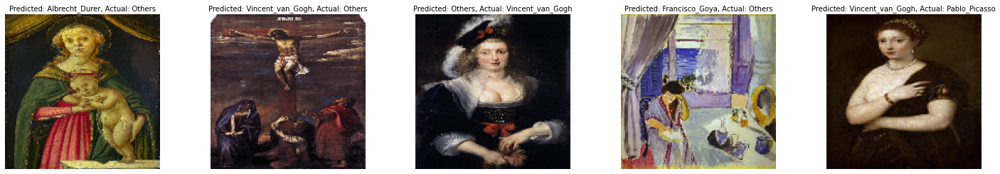

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_logit[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(logit_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

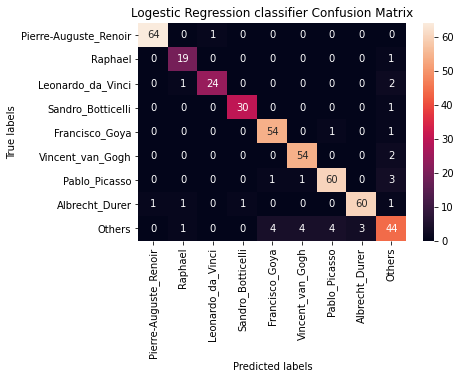

In [ ]:
cnf_matrixgs_logit = confusion_matrix(y_test,search_without_PCA.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrixgs_logit, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Logestic Regression classifier Confusion Matrix' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

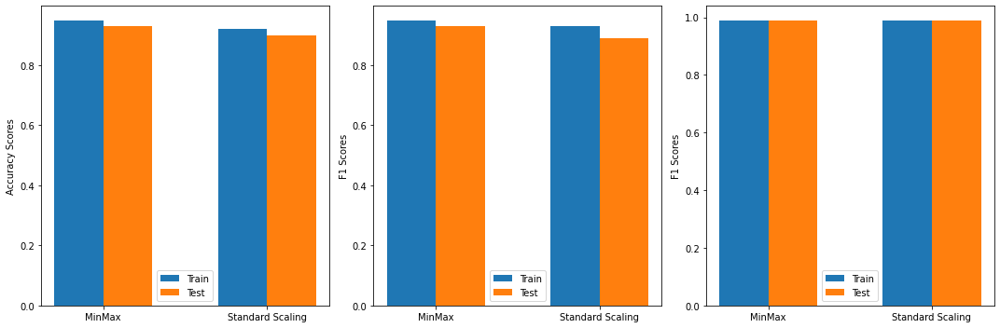

In [ ]:
accdata1 = [0.95,0.92]
accdata2 = [0.93, 0.90]

fdata1 = [0.95,0.93]
fdata2 = [0.93, 0.89]


rocdata1 = [0.99,0.99]
rocdata2 = [0.99, 0.99]

scalers = ['MinMax','Standard Scaling']
x = np.arange(len(scalers))  # the label locations
width =0.3
fig, ax = plt.subplots(1,3,figsize=(15,5))
rects1 = ax[0].bar(x - width/2, accdata1, width, label='Train')
rects2 = ax[0].bar(x + width/2, accdata2, width, label='Test')

rects3 = ax[1].bar(x - width/2, fdata1, width, label='Train')
rects4 = ax[1].bar(x + width/2, fdata2, width, label='Test')


rects5 = ax[2].bar(x - width/2, rocdata1, width, label='Train')
rects6 = ax[2].bar(x + width/2, rocdata2, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[0].set_ylabel('Accuracy Scores')

ax[0].set_xticks(x)
ax[0].set_xticklabels(scalers)
ax[0].legend()

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[1].set_ylabel('F1 Scores')

ax[1].set_xticks(x)
ax[1].set_xticklabels(scalers)
ax[1].legend()

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[2].set_ylabel('F1 Scores')

ax[2].set_xticks(x)
ax[2].set_xticklabels(scalers)
ax[2].legend()


fig.tight_layout()
plt.show()

In [ ]:
results_df = pd.DataFrame(search_without_PCAs.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
0.046415888336127774,{'logistic__C': 0.046415888336127774},1,0.904279,0.006469
21.54434690031882,{'logistic__C': 21.54434690031882},2,0.877815,0.016579
10000.0,{'logistic__C': 10000.0},3,0.829392,0.016732
0.0001,{'logistic__C': 0.0001},4,0.380068,0.004876


No handles with labels found to put in legend.


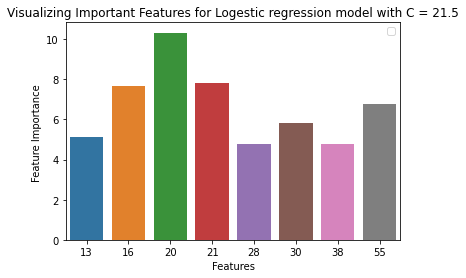

In [ ]:
ls_feature_imp = pd.Series(search_without_PCA.best_estimator_.named_steps['logistic'].coef_[0],features.columns).sort_values(ascending=False)
ls_feature_imp
sns.barplot(y=ls_feature_imp[0:8], x=ls_feature_imp.index[0:8])
# Add labels to your graph
plt.xlabel('Features')
plt.ylabel('Feature Importance ')
plt.title("Visualizing Important Features for Logestic regression model with C = 21.5")
plt.legend()
plt.show()

In [ ]:
feature_importances_ls = pd.DataFrame(search_without_PCA.best_estimator_.named_steps['logistic'].coef_[0],
                                   index = features.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

### Validation Curves

In [ ]:
c_val = np.logspace(-4, 2, 4)
train_scores, test_scores = validation_curve(pipe_without_PCA, X_train, y_train, param_name="logistic__C", param_range=c_val,
    scoring="accuracy", n_jobs=1,cv = 4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

In [ ]:
c_val = np.logspace(-4, 2, 4)
train_scores, test_scores = validation_curve(pipe_without_PCAs, X_train, y_train, param_name="logistic__C", param_range=c_vals,
    scoring="accuracy", n_jobs=1,cv = 4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

In [ ]:
c_vals = np.logspace(-2, 2, 4)
c_vals

array([1.00000000e-02, 2.15443469e-01, 4.64158883e+00, 1.00000000e+02])

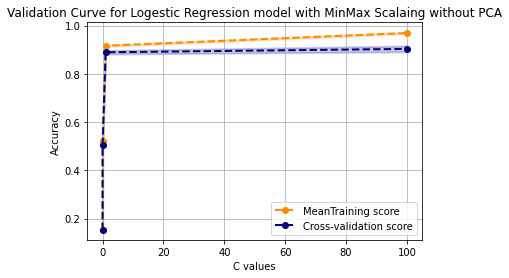

In [ ]:
plt.title("Validation Curve for Logestic Regression model with MinMax Scalaing without PCA")
plt.xlabel("C values")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
#plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(c_val, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
plt.fill_between(c_val, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.plot(c_val, train_scores_mean, label="MeanTraining score",
             color="darkorange", lw=lw ,ls='--',marker ='o')

plt.plot(c_val, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

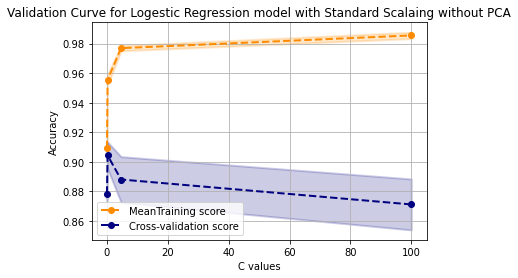

In [ ]:
plt.title("Validation Curve for Logestic Regression model with Standard Scalaing without PCA")
plt.xlabel("C values")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
#plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(c_vals, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
plt.fill_between(c_vals, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.plot(c_vals, train_scores_mean, label="MeanTraining score",
             color="darkorange", lw=lw ,ls='--',marker ='o')

plt.plot(c_vals, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## With PCA

### Accuracy

In [ ]:
# Parameters of pipelines can be set using ‘__’ separated parameter names:
pca = PCA()
pipe = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('logistic', logistic)])
param_grid = {
    'pca__n_components': [5, 15, 30, 45],
    'logistic__C': np.logspace(-4, 4, 4),
}
search = GridSearchCV(pipe, param_grid, n_jobs=-1,cv=4)
search.fit(X_train, y_train)
print("Best parameter (CV score=%0.3f):" % search.best_score_)
print(search.best_params_)


Best parameter (CV score=0.891):
{'logistic__C': 0.046415888336127774, 'pca__n_components': 45}


In [ ]:
	# Best training data accuracy
print("Logestic regression model with PCA")
print('Best training accuracy: %.3f' % search.best_score_)
print("Training accuracy score = ", search.score(X_train, y_train))
print("Testing accuracy score = ", search.score(X_test, y_test))

Logestic regression model with PCA
Best training accuracy: 0.891
Training accuracy score =  0.9256756756756757
Testing accuracy score =  0.8986486486486487


In [ ]:
results_df = pd.DataFrame(search.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
0.046415888336127774_45,"{'logistic__C': 0.046415888336127774, 'pca__n_...",1,0.891329,0.018936
21.54434690031882_45,"{'logistic__C': 21.54434690031882, 'pca__n_com...",2,0.877815,0.012477
21.54434690031882_30,"{'logistic__C': 21.54434690031882, 'pca__n_com...",3,0.851914,0.014887
10000.0_30,"{'logistic__C': 10000.0, 'pca__n_components': 30}",4,0.843468,0.022774
0.046415888336127774_30,"{'logistic__C': 0.046415888336127774, 'pca__n_...",5,0.842342,0.009422
10000.0_45,"{'logistic__C': 10000.0, 'pca__n_components': 45}",6,0.835586,0.026458
0.046415888336127774_15,"{'logistic__C': 0.046415888336127774, 'pca__n_...",7,0.767455,0.009736
21.54434690031882_15,"{'logistic__C': 21.54434690031882, 'pca__n_com...",8,0.762387,0.023216
10000.0_15,"{'logistic__C': 10000.0, 'pca__n_components': 15}",9,0.752252,0.021894


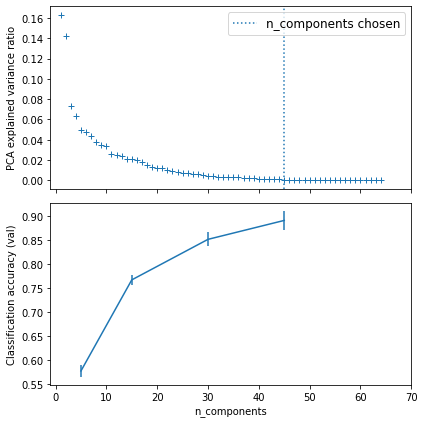

In [ ]:

# Plot the PCA spectrum
pca.fit(X_train)

fig, (ax0, ax1) = plt.subplots(nrows=2, sharex=True, figsize=(6, 6))
ax0.plot(np.arange(1, pca.n_components_ + 1),
         pca.explained_variance_ratio_, '+', linewidth=2)
ax0.set_ylabel('PCA explained variance ratio')

ax0.axvline(search.best_estimator_.named_steps['pca'].n_components,
            linestyle=':', label='n_components chosen')
ax0.legend(prop=dict(size=12))

# For each number of components, find the best classifier results
results = pd.DataFrame(search.cv_results_)
components_col = 'param_pca__n_components'
best_clfs = results.groupby(components_col).apply(
    lambda g: g.nlargest(1, 'mean_test_score'))

best_clfs.plot(x=components_col, y='mean_test_score', yerr='std_test_score',
               legend=False, ax=ax1)
ax1.set_ylabel('Classification accuracy (val)')
ax1.set_xlabel('n_components')

plt.xlim(-1, 70)

plt.tight_layout()
plt.show()

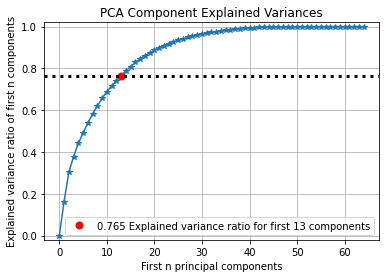

In [ ]:
skplt.decomposition.plot_pca_component_variance(pca)

In [ ]:
logit_scores

array([0.93693694, 0.94144144, 0.92342342, 0.92117117])

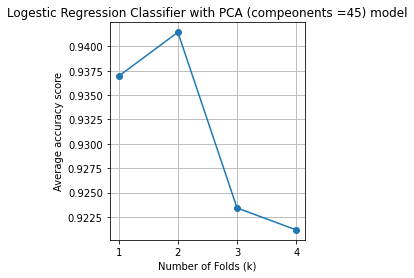

In [ ]:
# plot the change in the average accuracy according to k 
plt.figure(figsize=(3.5,4))
plt.title("Logestic Regression Classifier with PCA (compeonents =45) model")
plt.xlabel("Number of Folds (k)")
plt.ylabel("Average accuracy score")
plt.xticks =np.arange(1, 5, 1)
plt.grid()
plt.plot(np.arange(1, 5, 1),logit_scores,'o-');

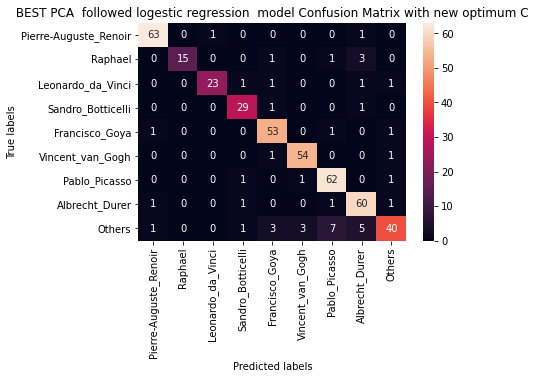

In [ ]:
cnf_matrix_logit_pp_gs = confusion_matrix(y_test,search.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_logit_pp_gs, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST PCA  followed logestic regression  model Confusion Matrix with new optimum C ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

In [ ]:
predict_logit_gs = search.predict_proba(X_test)

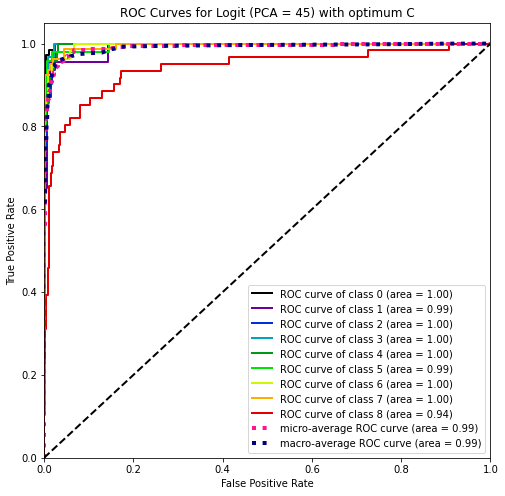

In [ ]:
skplt.metrics.plot_roc(y_test, predict_logit_gs,figsize=(8,8),title="ROC Curves for Logit (PCA = 45) with optimum C")
plt.show()

### F1 Score

In [ ]:
# Parameters of pipelines can be set using ‘__’ separated parameter names:
pca = PCA()
pipe = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('logistic', logistic)])
param_grid = {
    'pca__n_components': [5, 15, 30, 45],
    'logistic__C': np.logspace(-4, 4, 4),
}
search_f1 = GridSearchCV(pipe, param_grid, n_jobs=-1,scoring=f1)
search_f1.fit(X_train, y_train)
print("Best parameter (CV score=%0.3f):" % search_f1.best_score_)
print(search_f1.best_params_)

	# Best training data f1
print("Logestic regression model with PCA")
print('Best training f1: %.3f' % search_f1.best_score_)
print("Training f1 score = ", search_f1.score(X_train, y_train))
print("Testing f1 score = ", search_f1.score(X_test, y_test))


Best parameter (CV score=0.881):
{'logistic__C': 0.046415888336127774, 'pca__n_components': 45}
Logestic regression model with PCA
Best training f1: 0.881
Training f1 score =  0.9207050321624504
Testing f1 score =  0.8848565772402798


In [ ]:
results_df = pd.DataFrame(search_f1.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
0.046415888336127774_45,"{'logistic__C': 0.046415888336127774, 'pca__n_...",1,0.880914,0.013471
21.54434690031882_45,"{'logistic__C': 21.54434690031882, 'pca__n_com...",2,0.856715,0.011283
10000.0_30,"{'logistic__C': 10000.0, 'pca__n_components': 30}",3,0.840421,0.016037
21.54434690031882_30,"{'logistic__C': 21.54434690031882, 'pca__n_com...",4,0.838466,0.021121
0.046415888336127774_30,"{'logistic__C': 0.046415888336127774, 'pca__n_...",5,0.831490,0.005662
10000.0_45,"{'logistic__C': 10000.0, 'pca__n_components': 45}",6,0.818317,0.020084
10000.0_15,"{'logistic__C': 10000.0, 'pca__n_components': 15}",7,0.761811,0.024652
21.54434690031882_15,"{'logistic__C': 21.54434690031882, 'pca__n_com...",8,0.758488,0.024442
0.046415888336127774_15,"{'logistic__C': 0.046415888336127774, 'pca__n_...",9,0.753252,0.023968


In [ ]:
logit_scores_f1 = cross_val_score(search_f1, X_train, y_train, scoring=f1, cv=4)

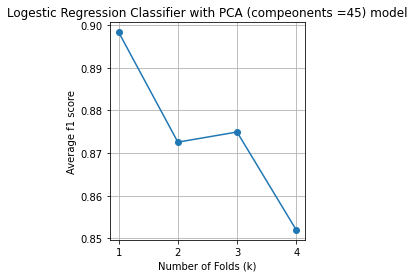

In [ ]:
# plot the change in the average accuracy according to k 
plt.figure(figsize=(3.5,4))
plt.title("Logestic Regression Classifier with PCA (compeonents =45) model")
plt.xlabel("Number of Folds (k)")
plt.ylabel("Average f1 score")
plt.xticks =np.arange(1, 5, 1)
plt.grid()
plt.plot(np.arange(1, 5, 1),logit_scores_f1,'o-');

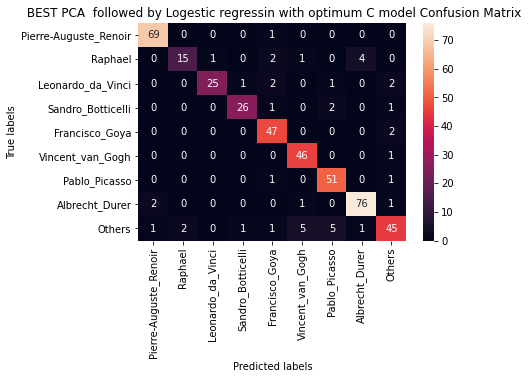

In [ ]:
cnf_matrix_logit_pp_gs1 = confusion_matrix(y_test,search_f1.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_logit_pp_gs1, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST PCA  followed by Logestic regressin with optimum C model Confusion Matrix' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

In [ ]:
predict_logit_gs1 = search_f1.predict_proba(X_test)

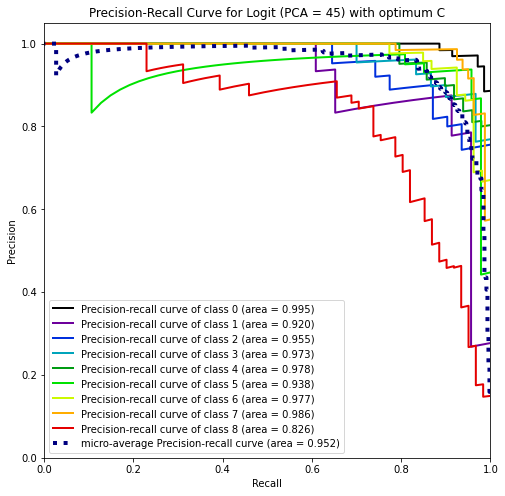

In [ ]:
skplt.metrics.plot_precision_recall_curve(y_test, predict_logit_gs1,figsize=(8,8),title="Precision-Recall Curve for Logit (PCA = 45) with optimum C")
plt.show()

### ROC Score

In [ ]:
# Parameters of pipelines can be set using ‘__’ separated parameter names:
pca = PCA()
pipe = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('logistic', logistic)])
param_grid = {
    'pca__n_components': [5, 15, 30, 45],
    'logistic__C': np.logspace(-4, 4, 4),
}
search_roc = GridSearchCV(pipe, param_grid, n_jobs=-1,scoring="roc_auc_ovr")
search_roc.fit(X_train, y_train)


In [ ]:
print("Best parameter (CV score=%0.3f):" % search_roc.best_score_)
print(search_roc.best_params_)

	# Best training data f1
print("Logestic regression model with PCA")
print('Best training roc-auc: %.3f' % search_roc.best_score_)
print("Training roc-auc score = ", search_roc.score(X_train, y_train))
print("Testing roc-auc score = ", search_roc.score(X_test, y_test))

Best parameter (CV score=0.984):
{'logistic__C': 0.046415888336127774, 'pca__n_components': 45}
Logestic regression model with PCA
Best training roc-auc: 0.984
Training roc-auc score =  0.9922274311288302
Testing roc-auc score =  0.9896430447081909


# SVM 

## Without PCA

In [ ]:
pipe_svc= make_pipeline(StandardScaler(), SVC(random_state=1,probability=True))

param_range= [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]

param_grid= [{'svc__C': param_range, 'svc__gamma': param_range,
'svc__kernel': ['rbf']}]

gs_svc= GridSearchCV(estimator=pipe_svc, param_grid=param_grid,scoring='accuracy', cv=4, refit=True)

In [ ]:
gs_svc= gs_svc.fit(X_train, y_train)

In [ ]:
print("SVC model based on all features")
print(gs_svc.best_params_)
#svc_scores = cross_val_score(gs_svc, X_train, y_train, scoring='accuracy', cv=4)

SVC model based on all features
{'svc__C': 100.0, 'svc__gamma': 0.001, 'svc__kernel': 'rbf'}


In [ ]:
print("SVC Training accuracy score = ", gs_svc.score(X_train, y_train))
#print('SVC CV mean accuracy: %.3f +/-%.3f' % (np.mean(svc_scores),np.std(svc_scores)))
print("SVC Testing accuracy score = ", gs_svc.score(X_test, y_test))

SVC Training accuracy score =  0.9791666666666666
SVC Testing accuracy score =  0.9009009009009009


In [ ]:
print("SVC Training accuracy score = ", gs_svc.score(X_train, y_train))
print("Testing accuracy score = ", gs_svc.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,gs_svc.best_estimator_.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,gs_svc.best_estimator_.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,gs_svc.best_estimator_.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,gs_svc.best_estimator_.predict_proba(X_test), multi_class='ovr'))

SVC Training accuracy score =  0.9791666666666666
Testing accuracy score =  0.9009009009009009
Best estimator training f1 score 0.9784451071019363
Best estimator testing f1 score 0.9018944455871323
Best estimator train roc-auc score 0.9994520975072358
Best estimator testing roc-auc score 0.9914860655088685


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_svc__C,param_svc__gamma,param_svc__kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.825465,0.016624,0.075836,0.000657,0.0001,0.0001,rbf,"{'svc__C': 0.0001, 'svc__gamma': 0.0001, 'svc_...",0.146396,0.146396,0.146396,0.286036,0.181306,0.060466,23
1,1.814895,0.009745,0.075629,0.000759,0.0001,0.001,rbf,"{'svc__C': 0.0001, 'svc__gamma': 0.001, 'svc__...",0.146396,0.146396,0.146396,0.288288,0.181869,0.061441,20
2,1.832272,0.011033,0.075757,0.000980,0.0001,0.01,rbf,"{'svc__C': 0.0001, 'svc__gamma': 0.01, 'svc__k...",0.146396,0.146396,0.146396,0.277027,0.179054,0.056565,27
3,1.816846,0.010851,0.076802,0.001567,0.0001,0.1,rbf,"{'svc__C': 0.0001, 'svc__gamma': 0.1, 'svc__ke...",0.146396,0.146396,0.146396,0.207207,0.161599,0.026332,34
4,1.847275,0.017632,0.076063,0.001480,0.0001,1,rbf,"{'svc__C': 0.0001, 'svc__gamma': 1.0, 'svc__ke...",0.146396,0.146396,0.146396,0.146396,0.146396,0.000000,45


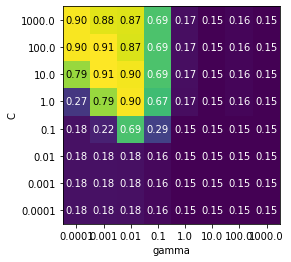

In [ ]:
# convert to DataFrame
results = pd.DataFrame(gs_svc.cv_results_)
# show the first 5 rows
display(results.head())
paramfram = pd.DataFrame(param_grid)
S_scores = np.array(results.mean_test_score).reshape(8, 8)
mglearn.tools.heatmap(S_scores, xlabel='gamma', xticklabels=paramfram['svc__gamma'][0],
ylabel='C', yticklabels=paramfram['svc__C'][0], cmap="viridis")

In [ ]:
results_df = pd.DataFrame(gs_svc.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
100.0_0.001_rbf,"{'svc__C': 100.0, 'svc__gamma': 0.001, 'svc__k...",1,0.908221,0.009736
10.0_0.001_rbf,"{'svc__C': 10.0, 'svc__gamma': 0.001, 'svc__ke...",2,0.908221,0.021389
1000.0_0.0001_rbf,"{'svc__C': 1000.0, 'svc__gamma': 0.0001, 'svc_...",3,0.900901,0.007638
1.0_0.01_rbf,"{'svc__C': 1.0, 'svc__gamma': 0.01, 'svc__kern...",3,0.900901,0.013419
100.0_0.0001_rbf,"{'svc__C': 100.0, 'svc__gamma': 0.0001, 'svc__...",5,0.899775,0.014289
...,...,...,...,...
0.01_1000.0_rbf,"{'svc__C': 0.01, 'svc__gamma': 1000.0, 'svc__k...",45,0.146396,0.000000
0.1_1.0_rbf,"{'svc__C': 0.1, 'svc__gamma': 1.0, 'svc__kerne...",45,0.146396,0.000000
0.1_10.0_rbf,"{'svc__C': 0.1, 'svc__gamma': 10.0, 'svc__kern...",45,0.146396,0.000000


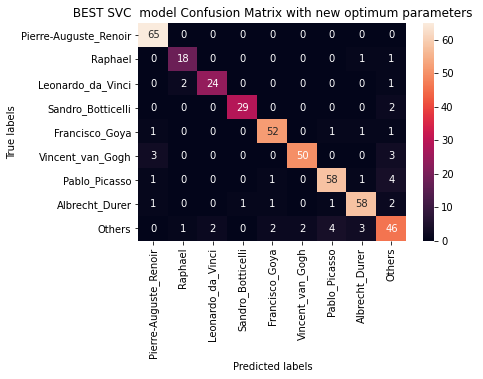

In [ ]:
cnf_matrix_svm = confusion_matrix(y_test,gs_svc.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_svm, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST SVC  model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


### Save model

In [ ]:
pkl_filename = "svm2.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(gs_svc, file)

In [ ]:
report = classification_report(y_test, gs_svc.predict(X_test), output_dict=True)
rep_df = pd.DataFrame(report).transpose()

In [ ]:
rep_df

,precision,recall,f1-score,support
0,0.957746,0.971429,0.964539,70.000000
1,1.000000,0.869565,0.930233,23.000000
2,1.000000,0.774194,0.872727,31.000000
3,0.928571,0.866667,0.896552,30.000000
4,0.851852,0.938776,0.893204,49.000000
5,0.938776,0.978723,0.958333,47.000000
6,0.925926,0.943396,0.934579,53.000000
7,0.962025,0.950000,0.955975,80.000000
8,0.784615,0.836066,0.809524,61.000000
accuracy,0.916667,0.916667,0.916667,0.916667


### Misclassification

In [ ]:
svm_pred=gs_svc.predict(X_test)
index = 0
misclassifiedIndexes_svm = []
for label, predict in zip(svm_pred, y_test):
    if label != predict: 
        misclassifiedIndexes_svm.append(index)
    index +=1

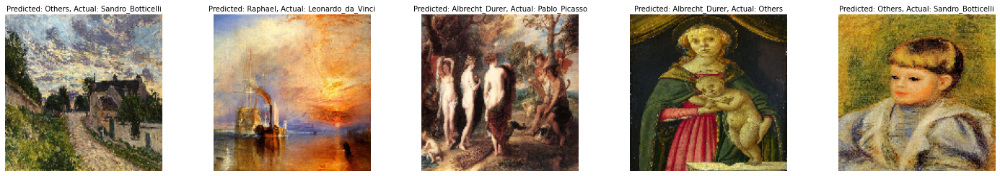

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_svm[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(svm_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

## PCA followed Feature Selection based on a model

In [ ]:
estimator = [('standardscaler', StandardScaler(with_mean=True, with_std=True)),
                  ("reduce_dim", PCA(n_components = 45, random_state= 42)),
                  ("feature_selection", SelectFromModel(RandomForestClassifier(random_state= 42,
                                                                             n_jobs = 50), threshold = 0.001)),
                  ("clf",SVC(random_state=42,probability=True) )
                  ]

In [ ]:
pp = Pipeline(estimator)



In [ ]:
pp.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('reduce_dim',
                 PCA(copy=True, iterated_power='auto', n_components=45,
                     random_state=42, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('feature_selection',
                 SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                                  ccp_alpha=0.0,
                                                                  class_weight=None,
                                                                  criterio...
                                                                  random_state=42,
                                                                  verbose=0,
                                                                  warm_start=False),
                                 max_features=None, 

In [ ]:
print("SVC Training accuracy score = ", pp.score(X_train, y_train))
print("SVC Testing accuracy score = ", pp.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,pp.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,pp.predict(X_test),average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,pp.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,pp.predict_proba(X_test), multi_class='ovr'))

SVC Training accuracy score =  0.9622747747747747
SVC Testing accuracy score =  0.9009009009009009
Best estimator training f1 score 0.9600613424599906
Best estimator testing f1 score 0.8953106767382911
Best estimator train roc-auc score 0.9990634657597551
Best estimator testing roc-auc score 0.991158898520434


In [ ]:
predict_ = pp.predict_proba(X_test)

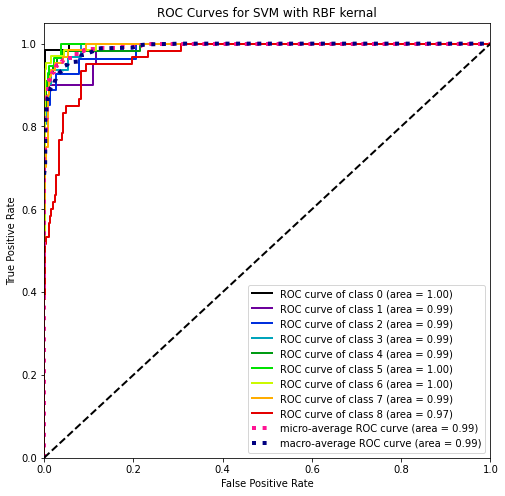

In [ ]:
skplt.metrics.plot_roc(y_test, predict_,figsize=(8,8),title="ROC Curves for SVM with RBF kernal")
plt.show()

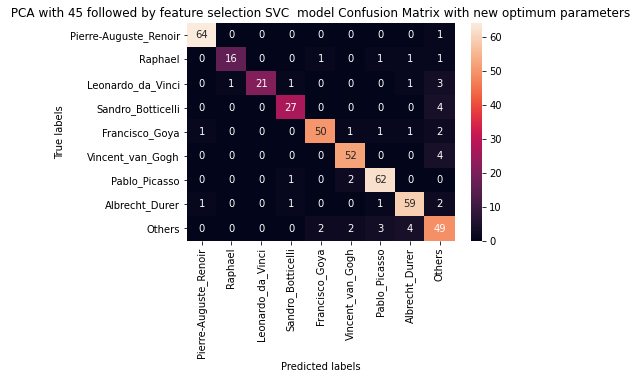

In [ ]:
cnf_matrix_svm_pp = confusion_matrix(y_test,pp.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_svm_pp, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' PCA with 45 followed by feature selection SVC  model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

### Save model

In [ ]:
pkl_filename = "pca_svm.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(pp, file)

### Parameter Tuning

#### based on accuracy

In [ ]:
param_range= [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]

param_grid_pca= [{'reduce_dim__n_components': [10,20,35]}, #not effective
             {'clf__C': param_range, 'clf__gamma': param_range,'clf__kernel': ['rbf']}]

gs_svc_pp= GridSearchCV(estimator=pp, param_grid=param_grid_pca,scoring='accuracy', cv=4, refit=True)

In [ ]:
gs_svc_pp= gs_svc_pp.fit(X_train, y_train)

In [ ]:
print("SVC model with PCA and feature selection")
print(gs_svc_pp.best_params_)
#svc_pca_scores = cross_val_score(gs_svc_pp, X_train, y_train, scoring='accuracy', cv=4)

SVC model with PCA and feature selection
{'clf__C': 100.0, 'clf__gamma': 0.001, 'clf__kernel': 'rbf'}


In [ ]:
gs_svc_pp.best_estimator_

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('reduce_dim',
                 PCA(copy=True, iterated_power='auto', n_components=45,
                     random_state=42, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('feature_selection',
                 SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                                  ccp_alpha=0.0,
                                                                  class_weight=None,
                                                                  criterio...
                                                                  random_state=42,
                                                                  verbose=0,
                                                                  warm_start=False),
                                 max_features=None, 

In [ ]:
print("SVC Training accuracy score = ", gs_svc_pp.score(X_train, y_train))
#print('SVC CV mean accuracy: %.3f +/-%.3f' % (np.mean(svc_pca_scores),np.std(svc_pca_scores)))
print("SVC Testing accuracy score = ", gs_svc_pp.score(X_test, y_test))

SVC Training accuracy score =  0.9684684684684685
SVC Testing accuracy score =  0.9009009009009009


In [ ]:
results_df = pd.DataFrame(gs_svc_pp.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
100.0_0.001_rbf,"{'clf__C': 100.0, 'clf__gamma': 0.001, 'clf__k...",1,0.900338,0.009605
10.0_0.001_rbf,"{'clf__C': 10.0, 'clf__gamma': 0.001, 'clf__ke...",2,0.894707,0.014801
1.0_0.01_rbf,"{'clf__C': 1.0, 'clf__gamma': 0.01, 'clf__kern...",3,0.891329,0.015635
1000.0_0.0001_rbf,"{'clf__C': 1000.0, 'clf__gamma': 0.0001, 'clf_...",4,0.889640,0.010683
10.0_0.01_rbf,"{'clf__C': 10.0, 'clf__gamma': 0.01, 'clf__ker...",5,0.886261,0.011091
...,...,...,...,...
0.1_1.0_rbf,"{'clf__C': 0.1, 'clf__gamma': 1.0, 'clf__kerne...",47,0.146396,0.000000
0.1_10.0_rbf,"{'clf__C': 0.1, 'clf__gamma': 10.0, 'clf__kern...",47,0.146396,0.000000
0.1_1000.0_rbf,"{'clf__C': 0.1, 'clf__gamma': 1000.0, 'clf__ke...",47,0.146396,0.000000


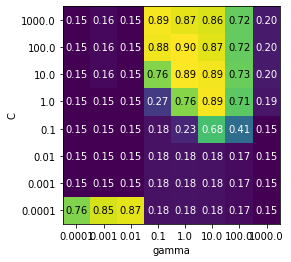

In [ ]:
# convert to DataFrame
results = pd.DataFrame(gs_svc_pp.cv_results_)
# show the first 5 rows
#display(results.head())
paramfram = pd.DataFrame(param_grid_pca)
S1_scores = np.array(results.mean_test_score[:64]).reshape(8, 8)
mglearn.tools.heatmap(S1_scores, xlabel='gamma', xticklabels=paramfram['clf__gamma'][1],
ylabel='C', yticklabels=paramfram['clf__C'][1], cmap="viridis")

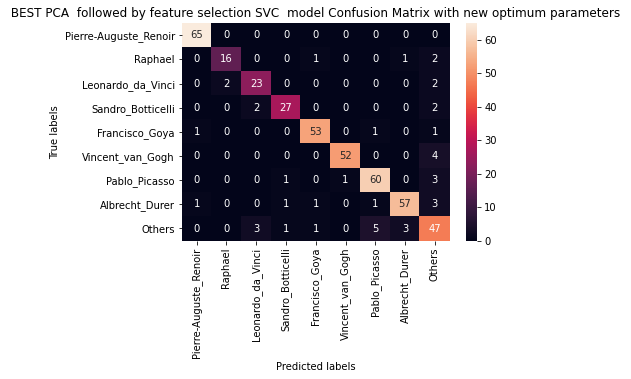

In [ ]:
cnf_matrix_svm_pp_gs = confusion_matrix(y_test,gs_svc_pp.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_svm_pp_gs, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST PCA  followed by feature selection SVC  model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

### Save the model

In [ ]:
pkl_filename = "pca_svm2.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(gs_svc_pp, file)

### Misclassification

In [ ]:
svm_pred2=gs_svc_pp.predict(X_test)
index = 0
misclassifiedIndexes_svm2 = []
for label, predict in zip(svm_pred2, y_test):
    if label != predict: 
        misclassifiedIndexes_svm2.append(index)
    index +=1

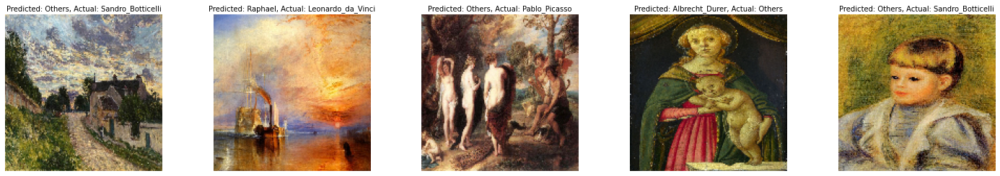

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_svm2[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(svm_pred2[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

In [ ]:
predict_gs = gs_svc_pp.predict_proba(X_test)

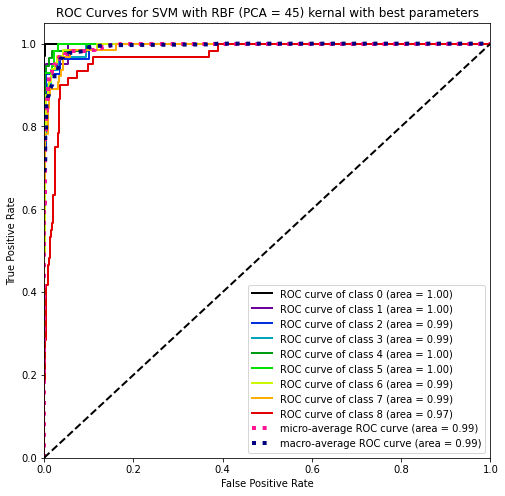

In [ ]:
skplt.metrics.plot_roc(y_test, predict_gs,figsize=(8,8),title="ROC Curves for SVM with RBF (PCA = 45) kernal with best parameters")
plt.show()

#### based on f1 score

In [ ]:
# Parameters of pipelines can be set using ‘__’ separated parameter names:
f1 = make_scorer(f1_score , average='macro')
pca = PCA()
param_grid_pca= [{'pca__n_components': [10,20,35], #not effective
             'clf__C': param_range, 'clf__gamma': param_range}]

pipe_svc_f = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('clf', SVC(random_state=42,probability=True))])

gs_pca_svm1 = GridSearchCV(pipe_svc_f, param_grid_pca, n_jobs=-1,scoring=f1)

In [ ]:

gs_pca_svm1.fit(X_train, y_train)

GridSearchCV(cv=None, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaling',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        SVC(C=1.0, break_ties=False,
                                            cache_size=200, class_weight=None,
                                            coef0=0.0,
                       

In [ ]:
print("SVC model with PCA based on f1")
print(gs_pca_svm1.best_params_)

SVC model with PCA based on f1
{'clf__C': 10.0, 'clf__gamma': 0.01, 'pca__n_components': 35}


In [ ]:
gs_pca_svm1.best_estimator_

Pipeline(memory=None,
         steps=[('scaling',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('pca',
                 PCA(copy=True, iterated_power='auto', n_components=35,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('clf',
                 SVC(C=10.0, break_ties=False, cache_size=200,
                     class_weight=None, coef0=0.0,
                     decision_function_shape='ovr', degree=3, gamma=0.01,
                     kernel='rbf', max_iter=-1, probability=True,
                     random_state=42, shrinking=True, tol=0.001,
                     verbose=False))],
         verbose=False)

In [ ]:
print("SVC Training f1 score = ", gs_pca_svm1.score(X_train, y_train))
#print('SVC CV mean accuracy: %.3f +/-%.3f' % (np.mean(svc_pca_scores),np.std(svc_pca_scores)))
print("SVC Testing f1 score = ", gs_pca_svm1.score(X_test, y_test))

SVC Training f1 score =  0.9676418734472523
SVC Testing f1 score =  0.8894083249270986


In [ ]:
results_df = pd.DataFrame(gs_pca_svm1.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
10.0_0.01_35,"{'clf__C': 10.0, 'clf__gamma': 0.01, 'pca__n_c...",1,0.876779,0.008327
100.0_0.001_35,"{'clf__C': 100.0, 'clf__gamma': 0.001, 'pca__n...",2,0.870807,0.020297
1000.0_0.0001_35,"{'clf__C': 1000.0, 'clf__gamma': 0.0001, 'pca_...",3,0.859339,0.009356
1.0_0.01_35,"{'clf__C': 1.0, 'clf__gamma': 0.01, 'pca__n_co...",4,0.852655,0.008715
1000.0_0.001_35,"{'clf__C': 1000.0, 'clf__gamma': 0.001, 'pca__...",5,0.848650,0.016186
...,...,...,...,...
0.01_1.0_20,"{'clf__C': 0.01, 'clf__gamma': 1.0, 'pca__n_co...",103,0.029514,0.000244
0.01_0.001_35,"{'clf__C': 0.01, 'clf__gamma': 0.001, 'pca__n_...",103,0.029514,0.000244
0.1_1000.0_35,"{'clf__C': 0.1, 'clf__gamma': 1000.0, 'pca__n_...",103,0.029514,0.000244


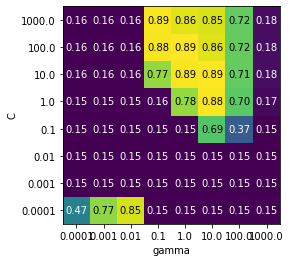

In [ ]:
# convert to DataFrame
results = pd.DataFrame(gs_pca_svm1.cv_results_)
# show the first 5 rows
#display(results.head())
paramfram = pd.DataFrame(param_grid_pca)
temp =results.loc[results['param_pca__n_components']==35]
S2_scores= np.array(temp.mean_test_score).reshape(8, 8)
mglearn.tools.heatmap(S1_scores, xlabel='gamma', xticklabels=paramfram['clf__gamma'][0],
ylabel='C', yticklabels=paramfram['clf__C'][0], cmap="viridis")

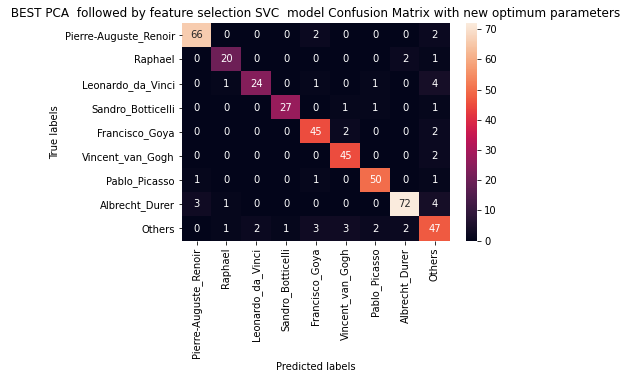

In [ ]:
cnf_matrix_svm1_pp_gs = confusion_matrix(y_test,gs_pca_svm1.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_svm1_pp_gs, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST PCA  followed by feature selection SVC  model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

In [ ]:
predict_gs1 = gs_pca_svm1.predict_proba(X_test)

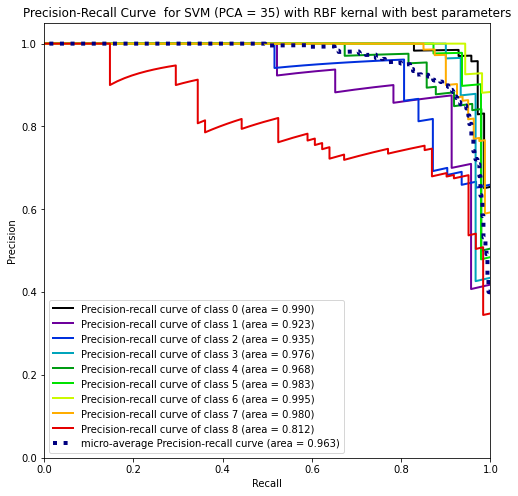

In [ ]:
skplt.metrics.plot_precision_recall_curve(y_test, predict_gs1,figsize=(8,8),title="Precision-Recall Curve  for SVM (PCA = 35) with RBF kernal with best parameters")
plt.show()

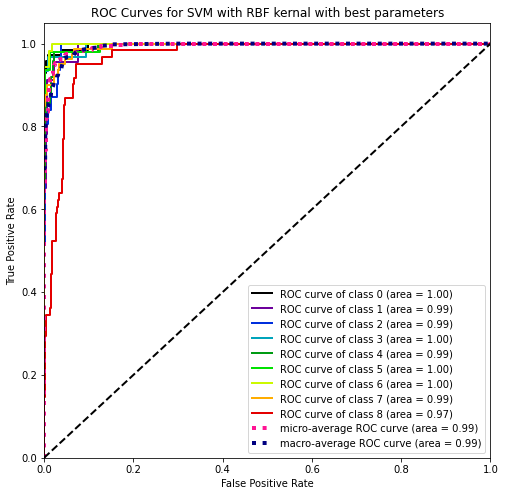

In [ ]:
skplt.metrics.plot_roc(y_test, predict_gs1,figsize=(8,8),title="ROC Curves for SVM (PCA = 35) with RBF kernal with best parameters")
plt.show()

#### based on ROC

In [ ]:
# Find best parameters using grid search with ROC
pca = PCA()
param_grid_pca= [{'pca__n_components': [10,20,35], #not effective
             'clf__C': param_range, 'clf__gamma': param_range}]

pipe_svc_roc = Pipeline(steps=[('scaling',StandardScaler()),('pca', pca), ('clf', SVC(random_state=42,probability=True))])

gs_pca_svm2 = GridSearchCV(pipe_svc_roc, param_grid_pca, n_jobs=-1,verbose=1,scoring='roc_auc_ovr')


In [ ]:
gs_pca_svm2.fit(X_train, y_train)

Fitting 5 folds for each of 192 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed: 12.4min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaling',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        SVC(C=1.0, break_ties=False,
                                            cache_size=200, class_weight=None,
                                            coef0=0.0,
                       

In [ ]:
print("SVC model with PCA based on roc score")
print(gs_pca_svm2.best_params_)

SVC model with PCA based on roc score
{'clf__C': 10.0, 'clf__gamma': 0.01, 'pca__n_components': 35}


In [ ]:
print("SVC Training roc score = ", gs_pca_svm2.score(X_train, y_train))
#print('SVC CV mean accuracy: %.3f +/-%.3f' % (np.mean(svc_pca_scores),np.std(svc_pca_scores)))
print("SVC Testing roc score = ", gs_pca_svm2.score(X_test, y_test))

SVC Training roc score =  0.9993745433201392
SVC Testing roc score =  0.9928457404879164


In [ ]:
results_df = pd.DataFrame(gs_pca_svm2.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
10.0_0.01_35,"{'clf__C': 10.0, 'clf__gamma': 0.01, 'pca__n_c...",1,0.987547,0.001878
1.0_0.01_35,"{'clf__C': 1.0, 'clf__gamma': 0.01, 'pca__n_co...",2,0.985399,0.002559
100.0_0.01_35,"{'clf__C': 100.0, 'clf__gamma': 0.01, 'pca__n_...",3,0.982955,0.003333
100.0_0.001_35,"{'clf__C': 100.0, 'clf__gamma': 0.001, 'pca__n...",4,0.982719,0.004717
10.0_0.01_20,"{'clf__C': 10.0, 'clf__gamma': 0.01, 'pca__n_c...",5,0.982553,0.003295
...,...,...,...,...
0.01_10.0_10,"{'clf__C': 0.01, 'clf__gamma': 10.0, 'pca__n_c...",188,0.338717,0.075079
1000.0_10.0_10,"{'clf__C': 1000.0, 'clf__gamma': 10.0, 'pca__n...",189,0.331284,0.042588
100.0_10.0_10,"{'clf__C': 100.0, 'clf__gamma': 10.0, 'pca__n_...",190,0.328225,0.043996


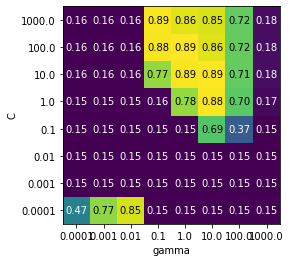

In [ ]:
# convert to DataFrame
results = pd.DataFrame(gs_pca_svm2.cv_results_)
# show the first 5 rows
#display(results.head())
paramfram = pd.DataFrame(param_grid_pca)
temp =results.loc[results['param_pca__n_components']==35]
S2_scores= np.array(temp.mean_test_score).reshape(8, 8)
mglearn.tools.heatmap(S1_scores, xlabel='gamma', xticklabels=paramfram['clf__gamma'][0],
ylabel='C', yticklabels=paramfram['clf__C'][0], cmap="viridis")

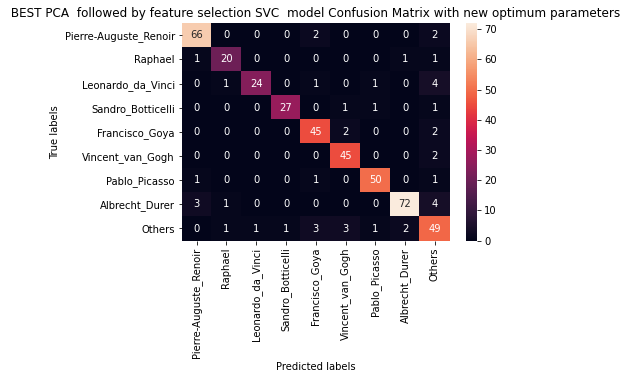

In [ ]:
cnf_matrix_svm2_pp_gs = confusion_matrix(y_test,gs_pca_svm2.predict(X_test))
ax= plt.subplot()
sns.heatmap(cnf_matrix_svm2_pp_gs, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( ' BEST PCA  followed by feature selection SVC  model Confusion Matrix with new optimum parameters ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

In [ ]:
predict_gs2 = gs_pca_svm2.predict_proba(X_test)


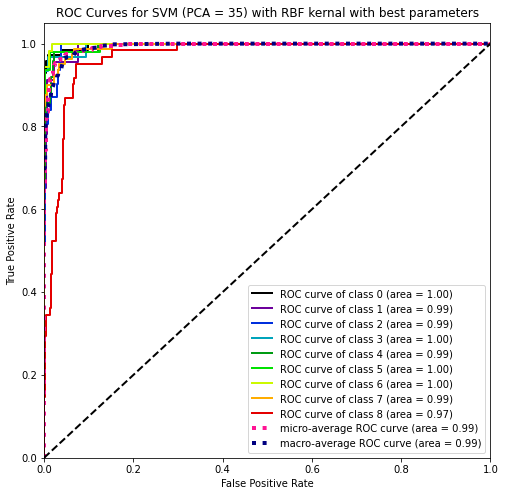

In [ ]:
skplt.metrics.plot_roc(y_test, predict_gs1,figsize=(8,8),title="ROC Curves for SVM (PCA = 35) with RBF kernal with best parameters")
plt.show()

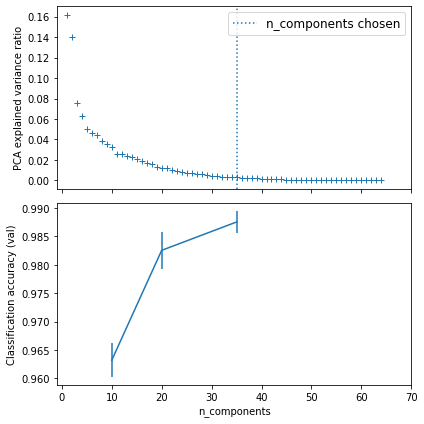

In [ ]:
 
# Plot the PCA spectrum
pca.fit(X_train)
 
fig, (ax0, ax1) = plt.subplots(nrows=2, sharex=True, figsize=(6, 6))
ax0.plot(np.arange(1, pca.n_components_ + 1),
         pca.explained_variance_ratio_, '+', linewidth=2)
ax0.set_ylabel('PCA explained variance ratio')
 
ax0.axvline(gs_pca_svm2.best_estimator_.named_steps['pca'].n_components,
            linestyle=':', label='n_components chosen')
ax0.legend(prop=dict(size=12))
 
# For each number of components, find the best classifier results
results = pd.DataFrame(gs_pca_svm2.cv_results_)
components_col = 'param_pca__n_components'
best_clfs = results.groupby(components_col).apply(
    lambda g: g.nlargest(1, 'mean_test_score'))
 
best_clfs.plot(x=components_col, y='mean_test_score', yerr='std_test_score',
               legend=False, ax=ax1)
ax1.set_ylabel('Classification accuracy (val)')
ax1.set_xlabel('n_components')
 
plt.xlim(-1, 70)
 
plt.tight_layout()
plt.show()

# Miclassification for the first 4

In [ ]:
elements_in_all4 = list(set.intersection(*map(set, [misclassifiedIndexes_knn, misclassifiedIndexes_logit, misclassifiedIndexes_RF1,misclassifiedIndexes_svm])))

In [ ]:
len(elements_in_all4)

12

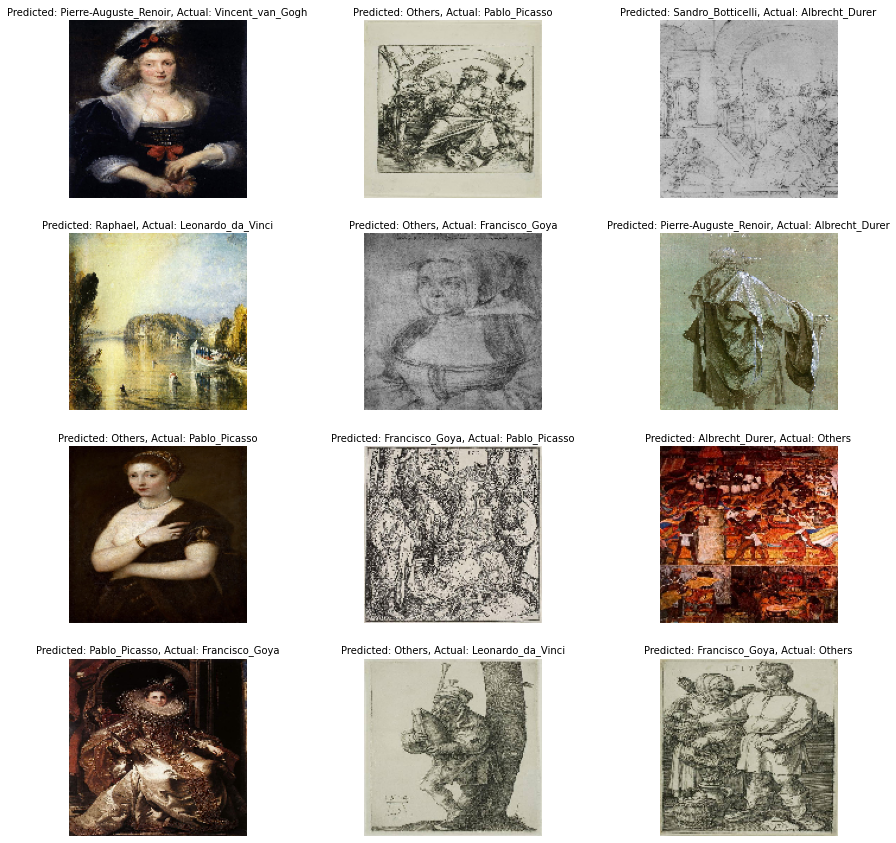

In [ ]:
plt.figure(figsize=(15,15))
for plotIndex, badIndex in enumerate(elements_in_all4):
    plt.subplot(4, 3, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(svm_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

# Ensemble Methodes (Bgging)

In [ ]:
#For the base classifier, we use decision tree (unpruned)
tree = DecisionTreeClassifier(criterion='gini', 
                              max_depth=None,
                              random_state=1)

bag = BaggingClassifier(base_estimator=tree,
                        n_estimators=750, 
                        max_samples=1.0, #draw 100% of the number of samples (with replacement) for each
                        max_features=1.0, #use 100% of the number of features (without replacement)
                        bootstrap=True, #sampling with replacement after each
                        bootstrap_features=False, 
                        n_jobs=1, 
                        random_state=1)

In [ ]:
from sklearn.metrics import accuracy_score

tree = tree.fit(X_train, y_train)
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

tree_train = accuracy_score(y_train, y_train_pred)
tree_test = accuracy_score(y_test, y_test_pred)
print('Decision tree train/test accuracies %.3f/%.3f'
      % (tree_train, tree_test))


Decision tree train/test accuracies 0.992/0.635


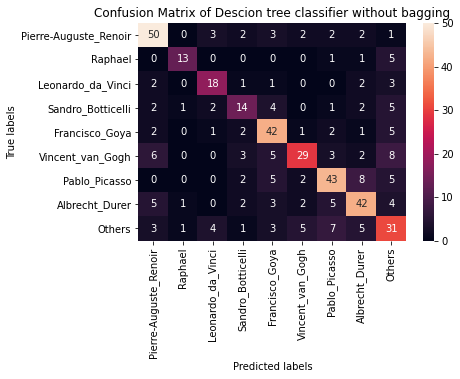

In [ ]:
cnf_matrix_tree = confusion_matrix(y_test,y_test_pred)
ax= plt.subplot()
sns.heatmap(cnf_matrix_tree, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of Descion tree classifier without bagging' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


In [ ]:
bag = bag.fit(X_train, y_train)
y_train_pred = bag.predict(X_train)
y_test_pred = bag.predict(X_test)

bag_train = accuracy_score(y_train, y_train_pred) 
bag_test = accuracy_score(y_test, y_test_pred) 
print('Bagging train/test accuracies %.3f/%.3f'
      % (bag_train, bag_test))

Bagging train/test accuracies 0.992/0.833


In [ ]:
bag.score(X_test,y_test)

0.8333333333333334

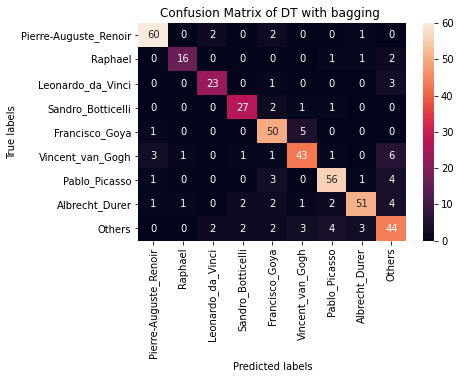

In [ ]:
cnf_matrix_bag = confusion_matrix(y_test,y_test_pred)
ax= plt.subplot()
sns.heatmap(cnf_matrix_bag, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of DT with bagging ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


In [ ]:
print("Testing accuracy score = ", bag.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,y_train_pred,average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,y_test_pred,average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,bag.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,bag.predict_proba(X_test), multi_class='ovr'))

Testing accuracy score =  0.8333333333333334
Best estimator training f1 score 0.9906262917353525
Best estimator testing f1 score 0.8351575876963534
Best estimator train roc-auc score 0.9999756682781606
Best estimator testing roc-auc score 0.9797796624554233


## Varing number of samples

In [ ]:
# get a list of models to evaluate
def get_models():
	models = dict()
	# explore ratios from 10% to 100% in 10% increments
	for i in np.arange(0.1, 1.1, 0.1):
		key = '%.1f' % i
		models[key] = BaggingClassifier (base_estimator=tree,n_estimators=750,max_samples=i,max_features=1.0,bootstrap=True,bootstrap_features=False, n_jobs=1,random_state=1)
	return models

In [ ]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
	# define the evaluation procedure
	#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
	# evaluate the model and collect the results
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=4, n_jobs=-1)
	return scores

>0.1 0.736 (0.016)
>0.2 0.767 (0.019)
>0.3 0.783 (0.017)
>0.4 0.792 (0.020)
>0.5 0.799 (0.020)
>0.6 0.801 (0.013)
>0.7 0.803 (0.020)
>0.8 0.800 (0.017)
>0.9 0.801 (0.015)
>1.0 0.805 (0.018)


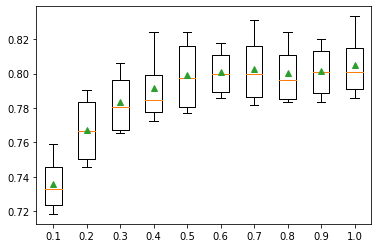

In [ ]:
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	# evaluate the model
	scores = evaluate_model(model, X_train, y_train)
	# store the results
	results.append(scores)
	names.append(name)
	# summarize the performance along the way
	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

In [ ]:
train_scores_mean = [0.736,0.767,0.783,0.792,0.799,0.801,0.803,0.800,0.801,0.805]
train_scores_std = np.mean([0.016,0.019,0.017,0.020,0.020,0.013,0.020,0.017,0.015,0.018])
ns =np.arange(0.1, 1.1, 0.1)

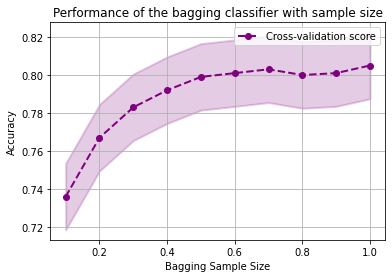

In [ ]:
plt.title("Performance of the bagging classifier with sample size")
plt.xlabel("Bagging Sample Size")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(ns, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="purple", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
#plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
             #    test_scores_mean + test_scores_std, alpha=0.2,
               #  color="navy", lw=lw)
plt.plot(ns, train_scores_mean, label="Cross-validation score",
             color="purple", lw=lw ,ls='--',marker ='o')

#plt.plot(n_trees, test_scores_mean, label="Cross-validation score",
            # color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## Varying number of estimators

In [ ]:
# get a list of models to evaluate
def get_models2():
	models = dict()
	# define number of trees to consider
	n_trees = [10, 50, 100, 500, 500, 1000, 5000]
	for n in n_trees:
		models[str(n)] = BaggingClassifier (base_estimator=tree,n_estimators=n,max_samples=1.0,max_features=1.0,bootstrap=True,bootstrap_features=False, n_jobs=1,random_state=1)
	return models

>10 0.740 (0.021)
>50 0.792 (0.028)
>100 0.797 (0.021)
>500 0.803 (0.020)
>1000 0.802 (0.018)
>5000 0.804 (0.019)


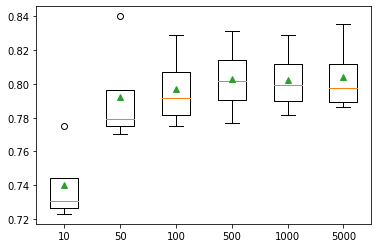

In [ ]:
models = get_models2()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	# evaluate the model
	scores = evaluate_model(model, X_train, y_train)
	# store the results
	results.append(scores)
	names.append(name)
	# summarize the performance along the way
	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

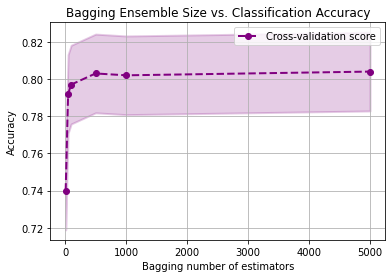

In [ ]:
train_scores_mean = [0.740,0.792,0.797,0.803,0.802,0.804]
train_scores_std = np.mean([0.021,0.028,0.021,0.020,0.018,0.019])
n_trees = [10, 50, 100, 500, 1000, 5000]
plt.title("Bagging Ensemble Size vs. Classification Accuracy")
plt.xlabel("Bagging number of estimators")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(n_trees, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="purple", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
#plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
             #    test_scores_mean + test_scores_std, alpha=0.2,
               #  color="navy", lw=lw)
plt.plot(n_trees, train_scores_mean, label="Cross-validation score",
             color="purple", lw=lw ,ls='--',marker ='o')

#plt.plot(n_trees, test_scores_mean, label="Cross-validation score",
            # color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## Checking accuracy by changing base estimator

In [ ]:
lr = LogisticRegression(max_iter=10000,multi_class='multinomial',solver='lbfgs');
pipe_lr = Pipeline(steps=[('scale',StandardScaler()), ('lr', lr)])

knn = Pipeline([
        ('scale', StandardScaler()),
        ('knn',KNeighborsClassifier())])
base_methods=[pipe_lr, knn, tree]

In [ ]:
for bm  in base_methods:
 print("Method: ", bm)
 bag_model = BaggingClassifier(base_estimator=bm,
                        n_estimators=750, 
                        max_samples=1.0, #draw 100% of the number of samples (with replacement) for each
                        max_features=1.0, #use 100% of the number of features (without replacement)
                        bootstrap=True, #sampling with replacement after each
                        bootstrap_features=False, 
                        n_jobs=1, 
                        random_state=1)
 bag_model=bag_model.fit(X_train,y_train)
 y_test_pred=bag_model.predict(X_test)
 print("Test accuracy",bag_model.score(X_test, y_test))
 #print(confusion_matrix(y_test, y_test_pred))
 if base_methods.index(bm) ==0:
  cmf_lr = confusion_matrix(y_test,y_test_pred)
 if base_methods.index(bm) ==1:
  cmf_knn = confusion_matrix(y_test,y_test_pred)
 if base_methods.index(bm) ==2:
  cmf_tree = confusion_matrix(y_test,y_test_pred)

Method:  Pipeline(memory=None,
         steps=[('scale',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('lr',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=10000,
                                    multi_class='multinomial', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)
Test accuracy 0.9144144144144144
Method:  Pipeline(memory=None,
         steps=[('scale',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('knn',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_

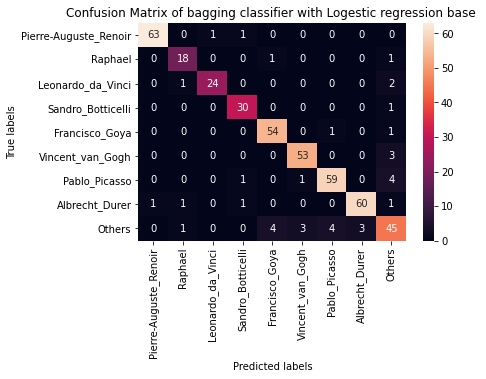

In [ ]:
ax= plt.subplot()
sns.heatmap(cmf_lr, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of bagging classifier with Logestic regression base ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

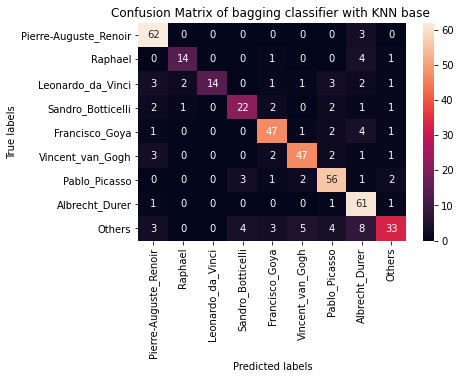

In [ ]:
ax= plt.subplot()
sns.heatmap(cmf_knn, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of bagging classifier with KNN base ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

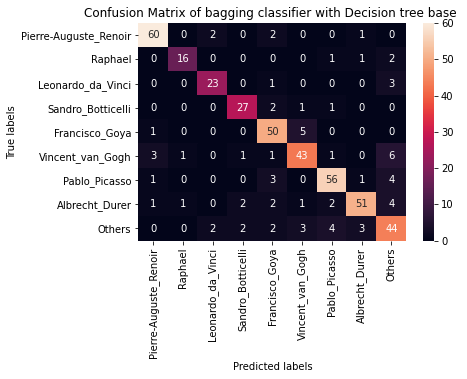

In [ ]:
ax= plt.subplot()
sns.heatmap(cmf_tree, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of bagging classifier with Decision tree base ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

## Best Model

In [ ]:
lr = LogisticRegression(max_iter=10000,multi_class='multinomial',solver='lbfgs');
pipe_lr = Pipeline(steps=[('scale',StandardScaler()), ('lr', lr)])
bag_model = BaggingClassifier(base_estimator=pipe_lr,
                      n_estimators=750, 
                      max_samples=1.0, #draw 100% of the number of samples (with replacement) for each
                      max_features=1.0, #use 100% of the number of features (without replacement)
                      bootstrap=True, #sampling with replacement after each
                      bootstrap_features=False, 
                      n_jobs=1, 
                      random_state=1)
bag_model=bag_model.fit(X_train,y_train)
y_test_pred=bag_model.predict(X_test)

In [ ]:
 print("Train accuracy",bag_model.score(X_train, y_train))
 print("Testing accuracy score = ", bag_model.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,bag_model.predict(X_train),average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,y_test_pred,average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,bag_model.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,bag_model.predict_proba(X_test), multi_class='ovr'))

Train accuracy 0.9650900900900901
Testing accuracy score =  0.9144144144144144
Best estimator training f1 score 0.9638573937385897
Best estimator testing f1 score 0.9127639842311203
Best estimator train roc-auc score 0.9987813328588584
Best estimator testing roc-auc score 0.9930166636171176


## Misclassification

In [ ]:
index = 0
misclassifiedIndexes_bag = []
for label, predict in zip(y_test, y_test_pred):
    if label != predict: 
       misclassifiedIndexes_bag.append(index)
    index +=1

In [ ]:
len(misclassifiedIndexes_bag)

38

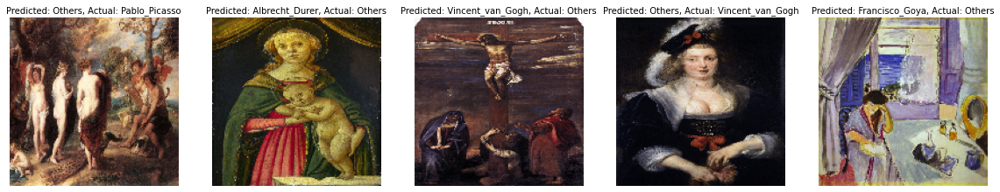

In [ ]:
plt.figure(figsize=(20,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_bag[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(y_test_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

## Save the model

In [ ]:

pkl_filename = "bag_logit22.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(bag_model, file)

In [ ]:
import pickle
# Load from file
pkl_filename = "bag_logit.pkl"
with open(pkl_filename, 'rb') as file:
    bag_logit_pickle_model = pickle.load(file)

# Ensemble Methods (AdaBoost)

In [ ]:
tree_ada = DecisionTreeClassifier(criterion='gini', 
                              max_depth=25,
                              random_state=1)

ada = AdaBoostClassifier(base_estimator=tree_ada,
                         n_estimators=750, 
                         learning_rate=2, #shrinks the contribution of each classifier
                         random_state=1)

In [ ]:
tree_ada = tree_ada.fit(X_train, y_train)
y_train_pred_ada = tree_ada.predict(X_train)
y_test_pred_ada = tree_ada.predict(X_test)

tree_ada_train = accuracy_score(y_train, y_train_pred_ada)
tree_ada_test = accuracy_score(y_test, y_test_pred_ada)
print('Decision tree train/test accuracies %.3f/%.3f'
      % (tree_ada_train, tree_ada_test))

Decision tree train/test accuracies 0.992/0.635


In [ ]:
ada = ada.fit(X_train, y_train)
y_train_pred_ada2 = ada.predict(X_train)
y_test_pred_ada2 = ada.predict(X_test)

ada2_train = accuracy_score(y_train, y_train_pred_ada2) 
ada2_test = accuracy_score(y_test, y_test_pred_ada2) 
print('AdaBoost train/test accuracies %.3f/%.3f'
      % (ada2_train, ada2_test))

AdaBoost train/test accuracies 0.992/0.878


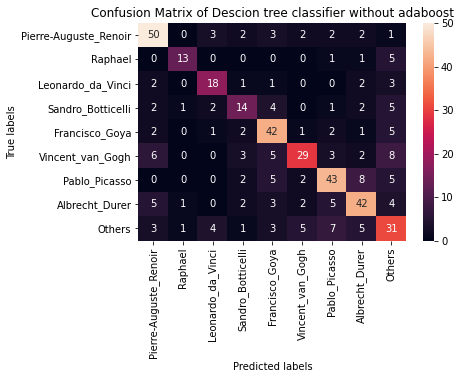

In [ ]:
cnf_matrix_tree_ada = confusion_matrix(y_test,y_test_pred_ada)
ax= plt.subplot()
sns.heatmap(cnf_matrix_tree_ada, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of Descion tree classifier without adaboost' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


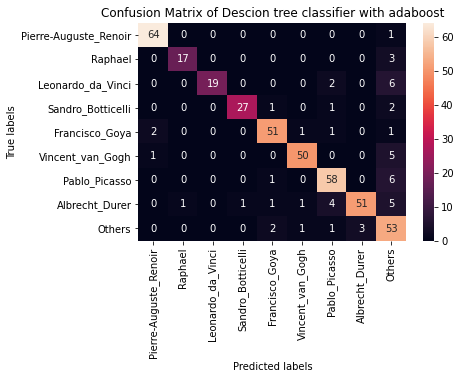

In [ ]:
cnf_matrix_ada = confusion_matrix(y_test,y_test_pred_ada2)
ax= plt.subplot()
sns.heatmap(cnf_matrix_ada, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of Descion tree classifier with adaboost' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


## Explore Number of Trees

In [ ]:
# get a list of models to evaluate
def get_models_trees():
	models = dict()
	# define number of trees to consider
	n_trees = [10, 50, 100, 500, 1000, 5000]
	for n in n_trees:
		models[str(n)]  = AdaBoostClassifier(base_estimator=tree_ada,
                         n_estimators=n, 
                         learning_rate=2, #shrinks the contribution of each classifier
                         random_state=1)
	return models

In [ ]:
# get the models to evaluate
models = get_models_trees()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	# evaluate the model
	scores = evaluate_model(model, X_train, y_train)
	# store the results
	results.append(scores)
	names.append(name)
	# summarize the performance along the way
	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))

>10 0.533 (0.026)
>50 0.706 (0.013)
>100 0.758 (0.012)
>500 0.813 (0.010)
>1000 0.825 (0.009)
>5000 0.822 (0.016)


In [ ]:
results

[array([0.55855856, 0.56081081, 0.50675676, 0.50675676]),
 array([0.70945946, 0.69594595, 0.72522523, 0.69369369]),
 array([0.76126126, 0.74324324, 0.77702703, 0.75225225]),
 array([0.81756757, 0.80405405, 0.82657658, 0.80405405]),
 array([0.83108108, 0.82207207, 0.83558559, 0.81081081]),
 array([0.83558559, 0.7972973 , 0.83558559, 0.81981982])]

In [ ]:
n_trees = [10, 50, 100, 500, 1000, 5000]
train_scores_mean = [0.533,0.706,0.758,0.813,0.825,0.822]
train_scores_std = np.mean([0.026,0.013,0.012,0.010,0.009,0.016])

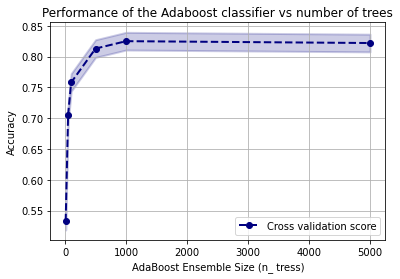

In [ ]:
plt.title("Performance of the Adaboost classifier vs number of trees")
plt.xlabel("AdaBoost Ensemble Size (n_ tress)")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(n_trees, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="navy", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
#plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
             #    test_scores_mean + test_scores_std, alpha=0.2,
               #  color="navy", lw=lw)
plt.plot(n_trees, train_scores_mean, label="Cross validation score",
             color="navy", lw=lw ,ls='--',marker ='o')

#plt.plot(n_trees, test_scores_mean, label="Cross-validation score",
            # color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## Explore Weak Learner

>1 0.329 (0.036)
>2 0.739 (0.008)
>3 0.780 (0.017)
>4 0.794 (0.009)
>5 0.815 (0.014)
>6 0.824 (0.009)
>7 0.832 (0.009)
>8 0.841 (0.014)
>9 0.858 (0.016)
>10 0.864 (0.008)


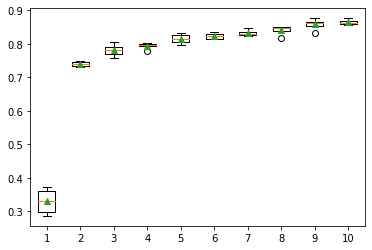

In [ ]:


# get a list of models to evaluate
def get_models_depth():
	models = dict()
	# explore depths from 1 to 10
	for i in range(1,11):
		# define base model
		base = DecisionTreeClassifier(max_depth=i)
		# define ensemble model
		models[str(i)] = AdaBoostClassifier(base_estimator=base,n_estimators=750,learning_rate=2)
	return models


models = get_models_depth()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	# evaluate the model
	scores = evaluate_model(model, X_train, y_train)
	# store the results
	results.append(scores)
	names.append(name)
	# summarize the performance along the way
	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

In [ ]:
train_scores_mean = [0.329,0.739,0.780,0.794,0.815,0.824,0.832,0.841,0.858,0.864]
train_scores_std = np.mean([0.036,0.008,0.017,0.009,0.014,0.009,0.009,0.014,0.016,0.008])
max_depth =range(1,11)

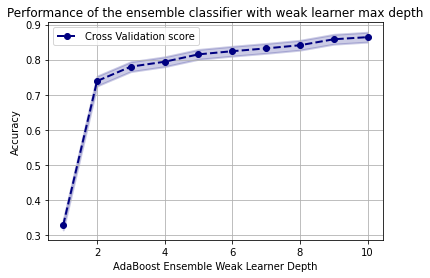

In [ ]:
plt.title("Performance of the ensemble classifier with weak learner max depth")
plt.xlabel("AdaBoost Ensemble Weak Learner Depth")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(max_depth, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="navy", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
#plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
             #    test_scores_mean + test_scores_std, alpha=0.2,
               #  color="navy", lw=lw)
plt.plot(max_depth, train_scores_mean, label="Cross Validation score",
             color="navy", lw=lw ,ls='--',marker ='o')

#plt.plot(n_trees, test_scores_mean, label="Cross-validation score",
            # color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## Explore Learning Rate

In [ ]:
# get a list of models to evaluate
def get_models_learn():
	models = dict()
	# explore learning rates from 0.1 to 2 in 0.1 increments
	for i in np.arange(0.1, 2.1, 0.1):
		key = '%.3f' % i
		models[key] = AdaBoostClassifier(base_estimator=tree_ada,n_estimators = 750 ,learning_rate=i)
	return models


# get the models to evaluate
models = get_models_learn()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	# evaluate the model
	scores = evaluate_model(model, X_train, y_train)
	# store the results
	results.append(scores)
	names.append(name)
	# summarize the performance along the way
	print('>%s %.3f (%.3f)' % (name, np.mean(scores), np.std(scores)))
# plot model performance for comparison
#pyplot.boxplot(results, labels=names, showmeans=True)
#pyplot.xticks(rotation=45)
#pyplot.show()

In [ ]:
train_scores_mean = [0.711,0.757,0.758,0.785,0.791,0.800,0.799,0.798,0.797,0.794,0.805,0.812,0.818,0.809,0.815,0.809,0.807,0.809,0.804,0.818]
train_scores_std = np.mean([0.018,0.005,0.010,0.011,0.012,0.008,0.004,0.004,0.012,0.016,0.014,0.009,0.013,0.007,0.015,0.014,0.017,0.012,0.011,0.016])
rate = np.arange(0.1, 2.1, 0.1)

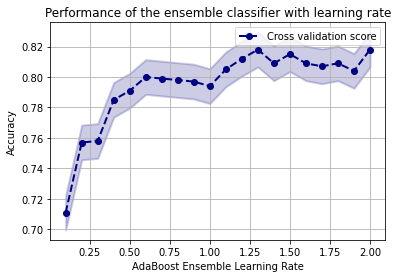

In [ ]:
plt.title("Performance of the ensemble classifier with learning rate")
plt.xlabel("AdaBoost Ensemble Learning Rate")
plt.ylabel("Accuracy")
#plt.ylim(0.0, 1.1)
plt.xticks = np.arange(0,200)
lw = 2
#plt.semilogx(nes, train_scores_mean, label="MeanTraining score",
      #       color="darkorange", lw=lw ,ls='--')
plt.fill_between(rate, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="navy", lw=lw)
#plt.semilogx(nes, test_scores_mean, label="Cross-validation score",
           #  color="navy", lw=lw,ls='--')
#plt.fill_between(k_neigh, test_scores_mean - test_scores_std,
             #    test_scores_mean + test_scores_std, alpha=0.2,
               #  color="navy", lw=lw)
plt.plot(rate, train_scores_mean, label="Cross validation score",
             color="navy", lw=lw ,ls='--',marker ='o')

#plt.plot(n_trees, test_scores_mean, label="Cross-validation score",
            # color="navy", lw=lw,ls='--',marker ='o')
plt.legend(loc="best")
plt.grid()
plt.show()

## Best Model

In [ ]:
tree_ada_new = DecisionTreeClassifier(criterion='entropy', 
                              max_depth=10,
                              random_state=1)

ada_new = AdaBoostClassifier(base_estimator=tree_ada_new,
                         n_estimators=800, 
                         learning_rate=2, #shrinks the contribution of each classifier
                         random_state=1)
ada_new = ada_new.fit(X_train, y_train)
y_train_pred_ada_new = ada_new.predict(X_train)
y_test_pred_ada_new = ada_new.predict(X_test)

ada3_train = accuracy_score(y_train, y_train_pred_ada_new) 
ada3_test = accuracy_score(y_test, y_test_pred_ada_new) 
print('AdaBoost train/test accuracies %.3f/%.3f'
      % (ada3_train, ada3_test))

AdaBoost train/test accuracies 0.992/0.867


In [ ]:
print("Testing accuracy score = ", ada_new.score(X_test, y_test))
print("Best estimator training f1 score",f1_score(y_train,y_train_pred_ada_new,average="macro"))
print("Best estimator testing f1 score",f1_score(y_test,y_test_pred_ada_new,average="macro"))
print("Best estimator train roc-auc score",roc_auc_score(y_train,ada_new.predict_proba(X_train), multi_class='ovr'))
print("Best estimator testing roc-auc score",roc_auc_score(y_test,ada_new.predict_proba(X_test), multi_class='ovr'))

Testing accuracy score =  0.8671171171171171
Best estimator training f1 score 0.9906412957106016
Best estimator testing f1 score 0.8615018209832489
Best estimator train roc-auc score 0.9999756682781609
Best estimator testing roc-auc score 0.9853535314905577


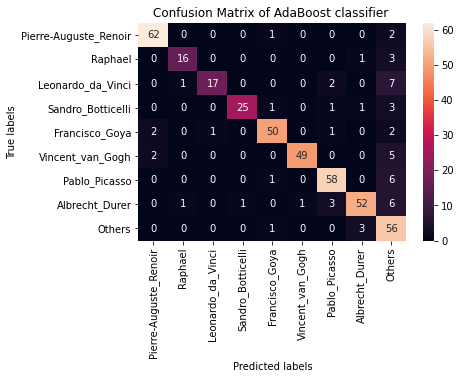

In [ ]:
cnf_matrix_ada = confusion_matrix(y_test,y_test_pred_ada_new)
ax= plt.subplot()
sns.heatmap(cnf_matrix_ada, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of AdaBoost classifier ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);


## Misclassification

In [ ]:
index = 0
misclassifiedIndexes_ada = []
y_test_pred_ada_new =ada_pickle_model.predict(X_test)
for label, predict in zip(y_test, y_test_pred_ada_new):
    if label != predict: 
       misclassifiedIndexes_ada.append(index)
    index +=1

In [ ]:
misclassifiedIndexes_ada

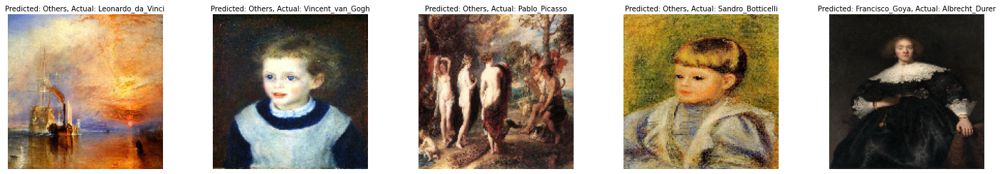

In [ ]:
plt.figure(figsize=(25,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_ada[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(y_test_pred_ada_new[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

## Save the model

In [ ]:
pkl_filename = "ada.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(ada_new, file)

## ROC Curve

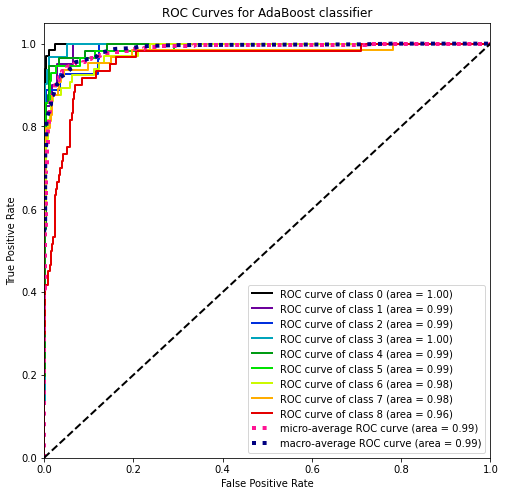

In [ ]:
predict_ada2 = ada_new.predict_proba(X_test)

skplt.metrics.plot_roc(y_test, predict_ada2,figsize=(8,8),title="ROC Curves for AdaBoost classifier")
plt.show()

# Misclassified samples among all classifiers

In [ ]:
elements_in_all = list(set.intersection(*map(set, [misclassifiedIndexes_knn, misclassifiedIndexes_logit, misclassifiedIndexes_RF1,misclassifiedIndexes_svm,misclassifiedIndexes_bag,misclassifiedIndexes_ada])))

In [ ]:
elements_in_all

[65, 225, 164, 325, 324, 424, 108, 434, 149, 216, 410]

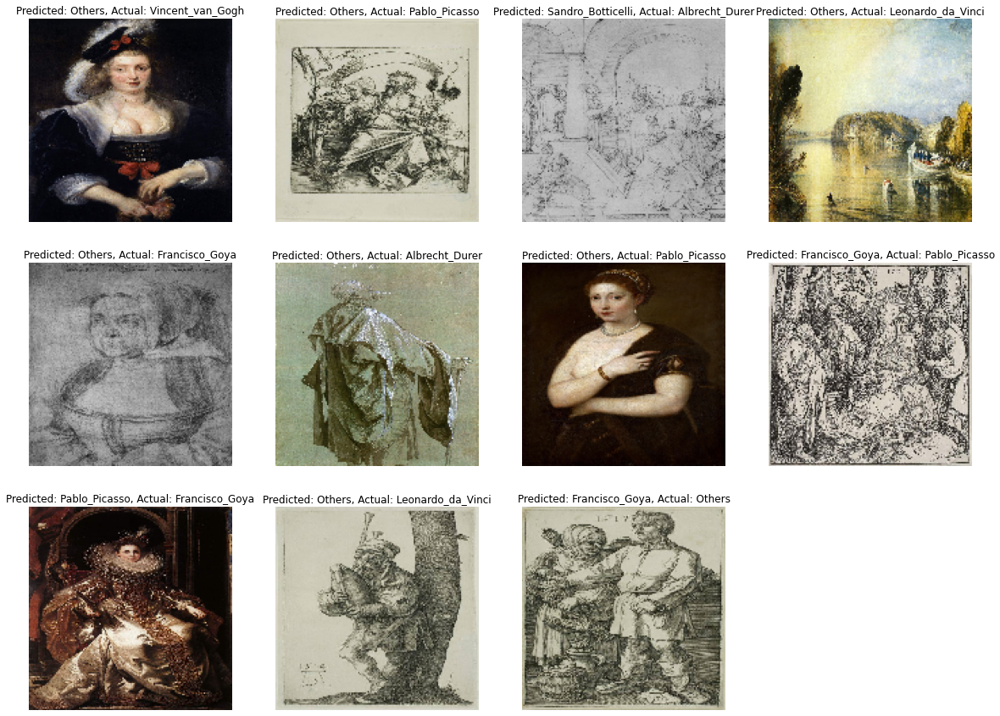

In [ ]:
plt.figure(figsize=(20,15))
for plotIndex, badIndex in enumerate(elements_in_all):
    plt.subplot(3, 4, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(y_test_pred_ada_new[badIndex]))], classes[y_test[badIndex]]), fontsize = 12)

# Blind Test

In [ ]:
X_b = pd.read_csv('blind_test_data.csv', header=None).values

In [ ]:
y_pred1 = bag_model.predict(X_b)

In [ ]:
y_pred1

array([3, 0, 7, 1, 4, 7, 2, 6, 8, 5, 4, 7, 6, 0, 6, 4, 3, 0, 3, 7, 2, 1,
       6, 4, 1, 3, 7, 8, 3, 5, 2, 5, 6, 6, 2, 3, 4, 8, 7, 2, 8, 5, 3, 2,
       1, 1, 0, 5, 1, 0, 1, 7, 5, 7, 8, 8, 0, 7, 1, 0, 2, 2, 3, 5, 1, 4,
       6, 5, 3, 0, 3, 2, 6, 0, 5, 5, 2, 0, 4, 1, 4, 6, 4, 4, 6, 8, 1, 8,
       7, 7])

In [ ]:
pd.DataFrame(y_pred1).to_csv('Elshamekh_Aliaa.csv', index = None, header = None)

# Overall best model

The best model is the logestic regression with bagging

In [ ]:
bag_model

BaggingClassifier(base_estimator=Pipeline(memory=None,
                                          steps=[('scale',
                                                  StandardScaler(copy=True,
                                                                 with_mean=True,
                                                                 with_std=True)),
                                                 ('lr',
                                                  LogisticRegression(C=1.0,
                                                                     class_weight=None,
                                                                     dual=False,
                                                                     fit_intercept=True,
                                                                     intercept_scaling=1,
                                                                     l1_ratio=None,
                                                                     max_iter=10000

## Model performance

In [ ]:
print("Logestic regression with bagging train accuracy",bag_model.score(X_train, y_train))
print("Logestic regression with bagging Testing accuracy score = ", bag_model.score(X_test, y_test))
print("Logestic regression with bagging training f1 score",f1_score(y_train,bag_model.predict(X_train),average="macro"))
print("Logestic regression with baggingtesting f1 score",f1_score(y_test,y_test_pred,average="macro"))
print("Logestic regression with bagging train roc-auc score",roc_auc_score(y_train,bag_model.predict_proba(X_train), multi_class='ovr'))
print("Logestic regression with bagging testing roc-auc score",roc_auc_score(y_test,bag_model.predict_proba(X_test), multi_class='ovr'))

Logestic regression with bagging train accuracy 0.9650900900900901
Logestic regression with bagging Testing accuracy score =  0.9144144144144144
Logestic regression with bagging training f1 score 0.9638573937385897
Logestic regression with baggingtesting f1 score 0.9127639842311203
Logestic regression with bagging train roc-auc score 0.9987813328588584
Logestic regression with bagging testing roc-auc score 0.9930166636171176


## Confusion matrix

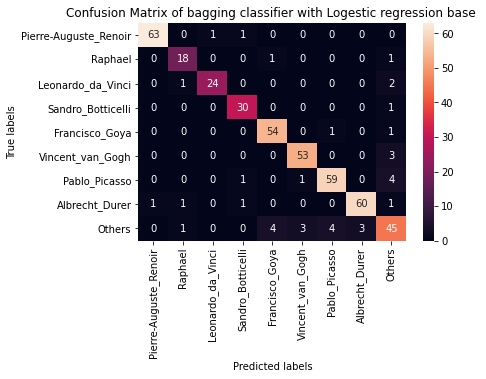

In [ ]:
y_test_pred = bag_model.predict(X_test)
cmf_lr = confusion_matrix(y_test,y_test_pred)
ax= plt.subplot()
sns.heatmap(cmf_lr, annot=True, ax = ax,fmt='d'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title( 'Confusion Matrix of bagging classifier with Logestic regression base ' ); 
ax.xaxis.set_ticklabels(classes,rotation=90); ax.yaxis.set_ticklabels(classes,rotation=0);

## Misclassified images

In [ ]:
index = 0
misclassifiedIndexes_bag = []
for label, predict in zip(y_test, y_test_pred):
    if label != predict: 
       misclassifiedIndexes_bag.append(index)
    index +=1

In [ ]:
len(misclassifiedIndexes_bag)

38

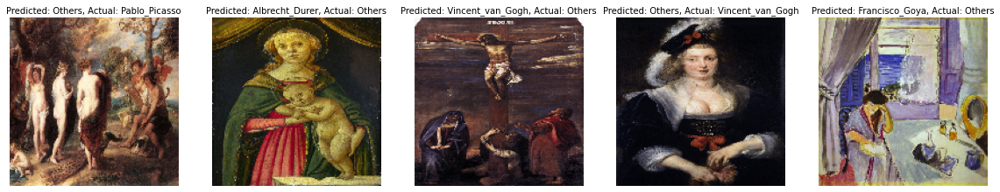

In [ ]:
plt.figure(figsize=(20,4))
for plotIndex, badIndex in enumerate(misclassifiedIndexes_bag[0:5]):
    plt.subplot(1, 5, plotIndex + 1)
    plt.imshow(img_test[badIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(y_test_pred[badIndex]))], classes[y_test[badIndex]]), fontsize = 10)

## Some of images that are classified correctly

In [ ]:
index = 0
corrclassifiedIndexes_bag = []
for label, predict in zip(y_test, y_test_pred):
    if label == predict: 
       corrclassifiedIndexes_bag.append(index)
    index +=1

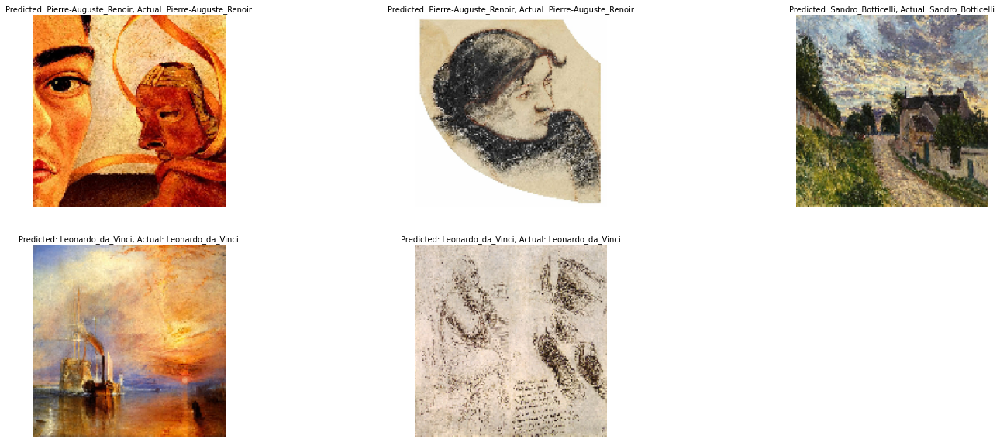

In [ ]:
plt.figure(figsize=(25,10))
for plotIndex, goodIndex in enumerate(corrclassifiedIndexes_bag[0:5]):
    plt.subplot(2, 3, plotIndex + 1)
    plt.imshow(img_test[goodIndex].reshape(150,150,3))
    plt.axis('off')
    plt.title('Predicted: {}, Actual: {}'.format( classes[(int(y_test_pred[goodIndex]))], classes[y_test[goodIndex]]), fontsize = 10)